<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Image-Captioning-with-Visual-Attention" data-toc-modified-id="Image-Captioning-with-Visual-Attention-1">Image Captioning with Visual Attention</a></span></li><li><span><a href="#Introduction" data-toc-modified-id="Introduction-2">Introduction</a></span></li><li><span><a href="#Step1:-Downloading-and-preparing-the-MS-COCO-dataset" data-toc-modified-id="Step1:-Downloading-and-preparing-the-MS-COCO-dataset-3">Step1: Downloading and preparing the MS-COCO dataset</a></span></li><li><span><a href="#Step-2:-Image-and-caption-preparation" data-toc-modified-id="Step-2:-Image-and-caption-preparation-4">Step 2: Image and caption preparation</a></span><ul class="toc-item"><li><span><a href="#Step2a:-Defining-an-Image-feature-extractor-(InceptionV3)" data-toc-modified-id="Step2a:-Defining-an-Image-feature-extractor-(InceptionV3)-4.1">Step2a: Defining an Image feature extractor (InceptionV3)</a></span></li><li><span><a href="#Step-2b:-Initialize-and-loading-InceptionV3-with-the-pretrained-Imagenet-weights" data-toc-modified-id="Step-2b:-Initialize-and-loading-InceptionV3-with-the-pretrained-Imagenet-weights-4.2">Step 2b: Initialize and loading InceptionV3 with the pretrained Imagenet weights</a></span></li><li><span><a href="#Step2c:-Caching-the-features-extracted-from-InceptionV3" data-toc-modified-id="Step2c:-Caching-the-features-extracted-from-InceptionV3-4.3">Step2c: Caching the features extracted from InceptionV3</a></span></li><li><span><a href="#Step-2d:-Caption-tokenization-and-preprocessing" data-toc-modified-id="Step-2d:-Caption-tokenization-and-preprocessing-4.4">Step 2d: Caption tokenization and preprocessing</a></span></li></ul></li><li><span><a href="#Step-3:-Dataset-preparation" data-toc-modified-id="Step-3:-Dataset-preparation-5">Step 3: Dataset preparation</a></span><ul class="toc-item"><li><span><a href="#Step-3a:-Splitting-data-in-train-and-validation-set" data-toc-modified-id="Step-3a:-Splitting-data-in-train-and-validation-set-5.1">Step 3a: Splitting data in train and validation set</a></span></li><li><span><a href="#Step-3b:-Creating-dataset-pipeline" data-toc-modified-id="Step-3b:-Creating-dataset-pipeline-5.2">Step 3b: Creating dataset pipeline</a></span></li></ul></li><li><span><a href="#Step-4:-Model-Definition" data-toc-modified-id="Step-4:-Model-Definition-6">Step 4: Model Definition</a></span><ul class="toc-item"><li><span><a href="#Step-4a:-Bahdanau's-Attention" data-toc-modified-id="Step-4a:-Bahdanau's-Attention-6.1">Step 4a: <strong><em>Bahdanau's Attention</em></strong></a></span></li><li><span><a href="#Step-4b:-CNN-Encoder" data-toc-modified-id="Step-4b:-CNN-Encoder-6.2">Step 4b: CNN Encoder</a></span></li><li><span><a href="#Step-4c:-Long-short-term-memory-Decoder" data-toc-modified-id="Step-4c:-Long-short-term-memory-Decoder-6.3">Step 4c: Long short-term memory Decoder</a></span></li><li><span><a href="#Step-4d:-Defining-optimizer-and-checkpoints" data-toc-modified-id="Step-4d:-Defining-optimizer-and-checkpoints-6.4">Step 4d: Defining optimizer and checkpoints</a></span></li></ul></li><li><span><a href="#Step-5:-Evalution,-attention-plot-and-caption-generation" data-toc-modified-id="Step-5:-Evalution,-attention-plot-and-caption-generation-7">Step 5: Evalution, attention plot and caption generation</a></span></li><li><span><a href="#Saving-Weights" data-toc-modified-id="Saving-Weights-8">Saving Weights</a></span></li><li><span><a href="#Step-6:-Training" data-toc-modified-id="Step-6:-Training-9">Step 6: Training</a></span></li><li><span><a href="#Loading-weights-back" data-toc-modified-id="Loading-weights-back-10">Loading weights back</a></span></li><li><span><a href="#Step-7:-Prediction" data-toc-modified-id="Step-7:-Prediction-11">Step 7: Prediction</a></span></li><li><span><a href="#Testing-on-other-images" data-toc-modified-id="Testing-on-other-images-12">Testing on other images</a></span></li></ul></div>

$Team$ $Members$
* **Saurabh Mishra - 64**
* **Vaibhav Singh - 67**
* **Virag Dosani - 77**

# Image Captioning with Visual Attention

Given an image like the example below, our goal is to generate a caption such as "**Dog playing with a ball**". 
<img src="https://live.staticflickr.com/8575/16201356354_fd78668c76_b.jpg" height="300" width="525"/>

# Introduction

Automatically generating captions of an image is a task very close to the heart of scene understanding — one of the primary goals of computer vision. Not only must caption generation models be powerful enough to solve the computer vision challenges of determining which objects are in an image, but they must also be capable of capturing and expressing their relationships in a natural language.

In [1]:
!pip install -q tqdm
!pip install -q wandb 
!wandb login 984196dfc7bc6ae6093fed3667fd5da413300d29

     |████████████████████████████████| 1.4MB 3.4MB/s 
     |████████████████████████████████| 112kB 40.5MB/s 
     |████████████████████████████████| 102kB 8.3MB/s 
     |████████████████████████████████| 102kB 10.4MB/s 
     |████████████████████████████████| 460kB 35.6MB/s 
     |████████████████████████████████| 71kB 7.0MB/s 
     |████████████████████████████████| 71kB 6.7MB/s 
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
Successfully logged in to Weights & Biases!


In [2]:
!pip install -q kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d thanakomsn/glove6b300dtxt
!unzip /content/glove6b300dtxt.zip
!rm -rf /content/glove6b300dtxt.zip

 99% 382M/386M [00:05<00:00, 73.2MB/s]
100% 386M/386M [00:05<00:00, 72.3MB/s]
Archive:  /content/glove6b300dtxt.zip
  inflating: glove.6B.300d.txt       


In [3]:
import wandb
wandb.init(project="image-captioning-test")

W&B Run: https://app.wandb.ai/veb-101/image-captioning-test/runs/14dmbbj2

In [0]:
import tensorflow as tf

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np
import os
import time
import json
from PIL import Image
import pickle
from tqdm import tqdm
import matplotlib.image as mpimg

# Step1: Downloading and preparing the MS-COCO dataset

In [5]:
# downloading caption annotation files
annotation_folder = '/annotations/'
if not os.path.exists(os.path.abspath('.') + annotation_folder):
    annotation_zip = tf.keras.utils.get_file('captions.zip',
                                             cache_subdir=os.path.abspath('.'),
                                             origin = 'http://images.cocodataset.org/annotations/annotations_trainval2014.zip',
                                             extract = True)
    annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
    os.remove(annotation_zip)
else:
    annotation_file = r"/content/annotations/captions_train2014.json"


# downloading image files
image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
    image_zip = tf.keras.utils.get_file('train2014.zip',
                                        cache_subdir=os.path.abspath('.'),
                                        origin = 'http://images.cocodataset.org/zips/train2014.zip',
                                        extract = True)
    PATH = os.path.dirname(image_zip) + image_folder
    os.remove(image_zip)
else:
    PATH = os.path.abspath('.') + image_folder

13510574080/13510573713 [==============================] - 333s 0us/step


In [0]:
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# storing each captions and image name
all_captions = []
all_img_name_vector = []

for annot in annotations['annotations']:
    caption = '<start> ' + annot['caption'] + ' <end>'
    image_id = annot['image_id']
    full_coco_image_path = PATH + 'COCO_train2014_' + '%012d.jpg' % (image_id)

    all_img_name_vector.append(full_coco_image_path)
    all_captions.append(caption)

train_captions, img_name_vector = shuffle(all_captions,
                                          all_img_name_vector,
                                          random_state=42)

In [0]:
# Select the first 50000 captions from the shuffled set
num_examples = 45000
train_captions = train_captions[:num_examples]
img_name_vector = img_name_vector[:num_examples]

In [8]:
len(train_captions), len(img_name_vector), len(all_captions)

(45000, 45000, 414113)

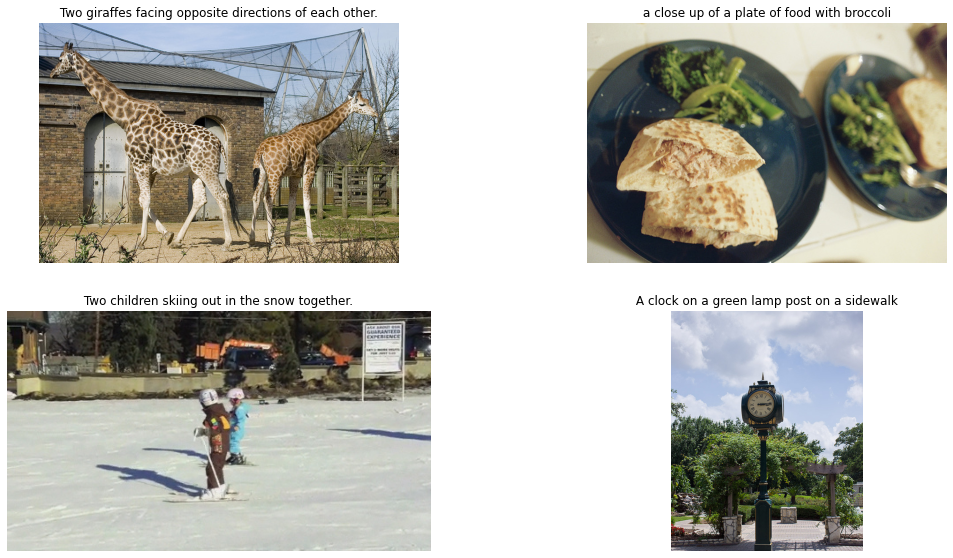

In [9]:
# Demo Images

plt.figure(figsize=(18, 15))
for i in range(4):
    plt.subplot(3, 2, i+1)
    caption_id = np.random.choice(range(len(train_captions)))
    image = mpimg.imread(img_name_vector[caption_id])
    caption = train_captions[caption_id].replace("<start>", '').replace("<end>", '')
    caption.strip()
    plt.title(caption)
    plt.imshow(image)
    plt.axis("off")

# Step 2: Image and caption preparation

## Step2a: Defining an Image feature extractor (InceptionV3)


In [0]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

## Step 2b: Initialize and loading InceptionV3 with the pretrained Imagenet weights 

In [11]:
image_model = tf.keras.applications.InceptionV3(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
    
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

87916544/87910968 [==============================] - 1s 0us/step


## Step2c: Caching the features extracted from InceptionV3


In [12]:
encode_train = sorted(set(img_name_vector))
print(len(encode_train))

# extracting features from images
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
    load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

# caching
for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    # temp = batch_features.shape
    batch_features = tf.reshape(batch_features,
                                (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        np.save(path_of_feature, bf.numpy())

36168


2261it [10:19,  3.65it/s]


In [0]:
# temp, batch_features.shape

## Step 2d: Caption tokenization and preprocessing

In [0]:
# train_captions[:2], img_name_vector[:2]

In [0]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [0]:
# Choosing all words in the embedding
top_k = 7500
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)

In [16]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

word_index = {}
k = 0
for i, j in tokenizer.word_index.items():
    if k < top_k:
        word_index[i] = j
        k += 1

print(len(tokenizer.word_index))
print(len(word_index))

9741
7500


In [0]:
# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)
# train_seqs[:2]

# Pad each vector to the max_length of the captions
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')
# cap_vector[:2]

# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)
# max_length

In [0]:
import csv
def create_csv(file, dict):
    with open(file, 'w') as csvfile:
        writer = csv.writer(csvfile)
        for key in dict.keys():
            writer.writerow([key,dict[key]])
create_csv('idx2word.csv', tokenizer.index_word)

# Step 3: Dataset preparation

## Step 3a: Splitting data in train and validation set

In [19]:
# Create training and validation sets using an 80-20 split
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,
                                                                    cap_vector,
                                                                    test_size=0.2,
                                                                    shuffle=True,
                                                                    random_state=47)

len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(36000, 36000, 9000, 9000)

In [0]:
# word embedding initialization

embeddings_index = {};
with open('/content/glove.6B.300d.txt') as f:
    for line in f:
        values = line.split();
        word = values[0];
        coefs = np.asarray(values[1:], dtype='float32');
        embeddings_index[word] = coefs;

## Step 3b: Creating dataset pipeline

In [0]:
# imp constants used later
EPOCHS = 20
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 300
units = 512
vocab_size = len(word_index) + 1
# num_steps = len(img_name_train)

In [0]:
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [0]:
# !rm -rf /content/glove.6B.300d.txt
embeddings_matrix = np.zeros((vocab_size, embedding_dim));
for word, i in word_index.items():
    embedding_vector = embeddings_index.get(word);
    if embedding_vector is not None:
        embeddings_matrix[i] = embedding_vector;

In [25]:
len(embeddings_matrix), len(embeddings_matrix[0])

(7501, 300)

In [0]:
config = wandb.config
config.CNN = "InceptionV3"
config.CNN_out_shape = "8x8x2048"
config.optimizer = "Adam-default" 
config.captions = num_examples
config.vocab_size = vocab_size
config.BATCH_SIZE = BATCH_SIZE
config.embedding_dim = embedding_dim
config.Decoder = "LSTM"
config.EPOCHS = EPOCHS
config.img_size = "299x299"

In [0]:
def map_func(img_name, cap):
    img_tensor = np.load(img_name.decode('utf-8') + '.npy')
    return img_tensor, cap

In [0]:
def createDataset(img_name, cap):
    dataset = tf.data.Dataset.from_tensor_slices((img_name, cap))
    # Use map to load the numpy files in parallel
    dataset = dataset.map(lambda item1, item2: tf.numpy_function(
            map_func, [item1, item2], [tf.float32, tf.int32]),
            num_parallel_calls=tf.data.experimental.AUTOTUNE)
    

    # Shuffle and batch
    dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [0]:
train_dataset = createDataset(img_name_train, cap_train)
valid_dataset = createDataset(img_name_val, cap_val)

# Step 4: Model Definition
<img src="https://raw.githubusercontent.com/veb-101/Image-Captioning/master/notebook%20images/model.png" height="350" width="600"/>

## Step 4a: ***Bahdanau's Attention***
<img src="https://raw.githubusercontent.com/veb-101/Image-Captioning/master/notebook%20images/attention.png" height="350"/>


$score(s_{t}, h_{i}) = v_{a}^{T}tanh(W_{a}[s_{t}:h_{i}])$

$\alpha_{t,i}=\frac{exp(score(s_{t-1},h_{i}))}{\sum_{i'=1}^{n}exp(score(s_{t-1}, h_{i'}))}$


$ContextVector_{t}=\sum_{i=1}^{n} \alpha_{t,i}h_{i}$

$\alpha$ ***= attention weights***

$s_{t}$ ***= previous state output***

$h_{i}$ ***= image feature 'i'***

In [0]:
class SoftAttention(tf.keras.Model):

    def __init__(self, units):
        super().__init__()
        self.W1 = tf.keras.layers.Dense(units)
        self.W2 = tf.keras.layers.Dense(units)
        self.V = tf.keras.layers.Dense(1)

    def call(self, features, hidden):
        hidden_with_time_axis = tf.expand_dims(hidden, 1)
        score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))
        attention_weights = tf.nn.softmax(self.V(score), axis=1)
        context_vector = attention_weights * features
        context_vector = tf.reduce_sum(context_vector, axis=1)
        return context_vector, attention_weights

## Step 4b: CNN Encoder

This encoder maps the input feature of size ***(64, 2048)*** to dimesion ***(64, 300)*** using a fully connected layer and applies a **relu** activation on the output.

In [0]:
class CNN_Encoder(tf.keras.Model):
    
    def __init__(self, embedding_dim):
        super().__init__()
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

## Step 4c: Long short-term memory Decoder

<img src="https://raw.githubusercontent.com/veb-101/Image-Captioning/master/notebook%20images/lstm.png" height="300" width="450">

LSTM as used in paper by [Recurrent Neural Network Regularization](https://arxiv.org/abs/1409.2329)

$h_{t-1}$ ***= previous state output***

$Ey_{t-1}$ ***= Word Embedding of previous state output (used as this state's input)***

$\hat{z}_{t}$ ***= Context Vector*** $t$ ***from Attention unit***

In [0]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, attention, embedding_dim, units, vocab_size):
        super().__init__()
        self.units = units

        self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length, 
                                                   weights=[embeddings_matrix], trainable=False)
        self.lstm = tf.keras.layers.LSTM(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')

        self.fc1 = tf.keras.layers.Dense(self.units)
        self.fc2 = tf.keras.layers.Dense(vocab_size)

        # need to change here
        self.attention = attention

    def call(self, x, features, hidden, dec="lstm"):
        context_vector, attention_weights = self.attention(features, hidden)
        x = self.embedding(x)
        x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)
        if dec == "lstm":
            lstm1, hidden_state_op, state_cell = self.lstm(x)
            x = self.fc1(hidden_state_op) 
            x = self.fc2(x)
            return x, hidden_state_op, attention_weights
        elif dec == "gru":
            hidden_state_op, state = self.gru(x)
            x = self.fc1(hidden_state_op) 
            x = tf.reshape(x, (-1, x.shape[2]))
            x = self.fc2(x)
            return x, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))


## Step 4d: Defining optimizer and checkpoints

In [0]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    return tf.reduce_mean(loss_)

In [0]:
import shutil
try:
    shutil.rmtree("checkpoints")
except:
    pass

In [0]:
start_epoch = 0

In [0]:
# checkpoint
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           attention=attention,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=2)

In [0]:
# # for restoring latest checkpoint
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    ckpt.restore(ckpt_manager.latest_checkpoint)

# Step 5: Evalution, attention plot and caption generation

In [0]:
def evaluate(image, encoder=None, decoder=None):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [0]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(15, 12))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.axis("off")
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

In [0]:
def predict(id=None, name=None, encoder=encoder, decoder=decoder):

    # captions on the validation set
    if id == None and name==None:
        rid = np.random.randint(0, len(img_name_val))
    else:
        rid = id

    if rid:    
        real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
        print ('Real Caption:', real_caption)

    
    
    if name == None:
        image = img_name_val[rid]
    else:
        image = name
        rid=None

    result, attention_plot = evaluate(image, encoder=encoder, decoder=decoder)
    print ('Prediction Caption:', ' '.join(result))
    print(rid, image)
    plot_attention(image, result, attention_plot)
    plt.figure(figsize=(12, 10))
    img = mpimg.imread(image)
    plt.imshow(img)
    plt.axis("off")


# Saving Weights



In [0]:
import shutil

try:
    shutil.rmtree("/content/Attention")
    shutil.rmtree("/content/Decoder")
    shutil.rmtree("/content/Encoder")
except:
    pass

In [0]:
# SAVING
## ENCODER
from google.colab import files

def save():
    encoder.save_weights("./Encoder/encoder_weights", save_format='tf')

    ## Attention
    attention.save_weights("./Attention/attention_weights", save_format='tf')

    ## Decoder
    decoder.save_weights("./Decoder/decoder_weights", save_format='tf')

    # DOWNLOADING WEIGHTS
    !zip -rq Attention.zip ./Attention
    !zip -rq Encoder.zip ./Encoder
    !zip -rq Decoder.zip ./Decoder

    !zip -rq all.zip Attention.zip Encoder.zip Decoder.zip
    !rm -rf Attention.zip Decoder.zip Encoder.zip


    shutil.rmtree("/content/Attention")
    shutil.rmtree("/content/Decoder")
    shutil.rmtree("/content/Encoder")

    # files.download('all.zip')
    # !rm -rf all.zip

# Step 6: Training

* You extract the features stored in the respective `.npy` files and then pass those features through the encoder.
* The encoder output, hidden state(initialized to 0) and the decoder input (which is the start token) is passed to the decoder.
* The decoder returns the predictions and the decoder hidden state.
* The decoder hidden state is then passed back into the model and the predictions are used to calculate the loss.
* Use teacher forcing to decide the next input to the decoder.
* Teacher forcing is the technique where the target word is passed as the next input to the decoder.
* The final step is to calculate the gradients and apply it to the optimizer and backpropagate.

In [0]:
train_loss_plot = []
valid_loss_plot = []

In [0]:
# @tf.function
def train_step(img_tensor, target, encoder=None, decoder=None):
    loss = 0

    # initializing the hidden state for each batch
    # because the captions are not related from image to image
    hidden = decoder.reset_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    with tf.GradientTape() as tape:
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
            predictions, hidden, _ = decoder(dec_input, features, hidden, "lstm")
            loss += loss_function(target[:, i], predictions)
            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))
    trainable_variables = encoder.trainable_variables + decoder.trainable_variables
    gradients = tape.gradient(loss, trainable_variables)
    optimizer.apply_gradients(zip(gradients, trainable_variables))
    return loss, total_loss


# @tf.function
def valid_step(img_tensor, target, encoder=None, decoder=None):
    loss = 0
    hidden = decoder.reset_state(batch_size=target.shape[0])
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

    features = encoder(img_tensor)
    for i in range(1, target.shape[1]):
        predictions, hidden, _ = decoder(dec_input, features, hidden, "lstm")
        loss += loss_function(target[:, i], predictions)
        dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))

    return loss, total_loss

In [0]:
def startTraining(start_epoch, EPOCHS, training_data=None, validation_data=None, encoder=None, decoder=None):
    for epoch in range(start_epoch, EPOCHS):
        start = time.time()
        train_total_loss = 0
        valid_total_loss = 0

        train_num_steps = 0
        valid_num_steps = 0


        for (batch, (img_tensor, target)) in enumerate(training_data):
            batch_loss, t_loss = train_step(img_tensor, target, encoder, decoder)
            train_total_loss += t_loss
            train_num_steps += 1
            if batch % 100 == 0:
                print (f'Epoch {epoch + 1} Batch {batch} Loss {batch_loss.numpy()/int(target.shape[1]):.4f}')

        
        for (b, (tensor, tar)) in enumerate(validation_data):
            # print(tensor, tar)
            _, t_loss = valid_step(tensor, tar, encoder, decoder)
            valid_total_loss += t_loss
            valid_num_steps += 1

        
        train_loss_steps = train_total_loss / train_num_steps
        valid_loss_steps = valid_total_loss / valid_num_steps
        
        train_loss_plot.append(train_loss_steps)
        valid_loss_plot.append(valid_loss_steps)


        # if epoch % 3 == 0:
        #     ckpt_manager.save()

        print (f'Epoch: {epoch + 1}; Train Loss: {train_loss_steps:.6f}; Validation loss: {valid_loss_steps:.6f}')
        print (f'Time taken for {epoch + 1}; Epoch {time.time() - start} sec\n')
        
        wandb.log({"train_loss": train_loss_steps, "valid_loss": valid_loss_steps, "epoch": epoch + 1})
        
        if input("Save weights: ") == "y":
            save()
            print("Weights Saved")

        if input("Terminate: ") == "y":
            print("finished Training")
            return None

In [0]:
encoder = CNN_Encoder(embedding_dim)
attention = SoftAttention(units)
decoder = RNN_Decoder(attention, embedding_dim, units, vocab_size)

In [61]:
startTraining(start_epoch, EPOCHS, training_data=train_dataset, validation_data=valid_dataset, encoder=encoder, decoder=decoder)

Epoch 1 Batch 0 Loss 2.1394
Epoch 1 Batch 100 Loss 1.3223
Epoch 1 Batch 200 Loss 1.2835
Epoch 1 Batch 300 Loss 1.2329
Epoch 1 Batch 400 Loss 1.1657
Epoch 1 Batch 500 Loss 1.0535
Epoch: 1; Train Loss: 1.228358; Validation loss: 1.005958
Time taken for 1; Epoch 850.2502801418304 sec

Save weights: y
Weights Saved
Terminate: n
Epoch 2 Batch 0 Loss 0.9921
Epoch 2 Batch 100 Loss 0.9718
Epoch 2 Batch 200 Loss 0.9550
Epoch 2 Batch 300 Loss 0.9418
Epoch 2 Batch 400 Loss 0.8109
Epoch 2 Batch 500 Loss 0.8075
Epoch: 2; Train Loss: 0.878002; Validation loss: 0.826471
Time taken for 2; Epoch 864.7819554805756 sec

Save weights: y
Weights Saved
Terminate: n
Epoch 3 Batch 0 Loss 0.7966
Epoch 3 Batch 100 Loss 0.8063
Epoch 3 Batch 200 Loss 0.8142
Epoch 3 Batch 300 Loss 0.7205
Epoch 3 Batch 400 Loss 0.6949
Epoch 3 Batch 500 Loss 0.7867
Epoch: 3; Train Loss: 0.766892; Validation loss: 0.792328
Time taken for 3; Epoch 866.5353519916534 sec

Save weights: y
Weights Saved
Terminate: n
Epoch 4 Batch 0 Loss 0

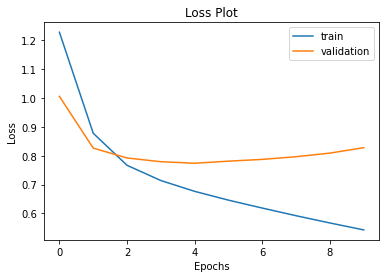

In [62]:
plt.plot(train_loss_plot, label="train")
plt.plot(valid_loss_plot, label="validation")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.legend()
plt.show()

In [0]:
# wandb.save('./checkpoints/train/*ckpt*')

# Loading weights back

In [0]:
!unzip -qq all.zip
!unzip -qq Attention.zip
!unzip -qq Encoder.zip
!unzip -qq Decoder.zip

!rm -rf Attention.zip Encoder.zip Decoder.zip

In [65]:
encoder2 = CNN_Encoder(embedding_dim)
encoder2.load_weights("./Encoder/encoder_weights")

attention2 = SoftAttention(units)
attention2.load_weights("./Attention/attention_weights")

decoder2 = RNN_Decoder(attention, embedding_dim, units, vocab_size)
decoder2.load_weights("./Decoder/decoder_weights")

# Step 7: Prediction

Real Caption: <start> a giraffe laying on lush green grass next to trees <end>
Prediction Caption: a giraffe standing next to each other in a tree <end>
2963 /content/train2014/COCO_train2014_000000424978.jpg


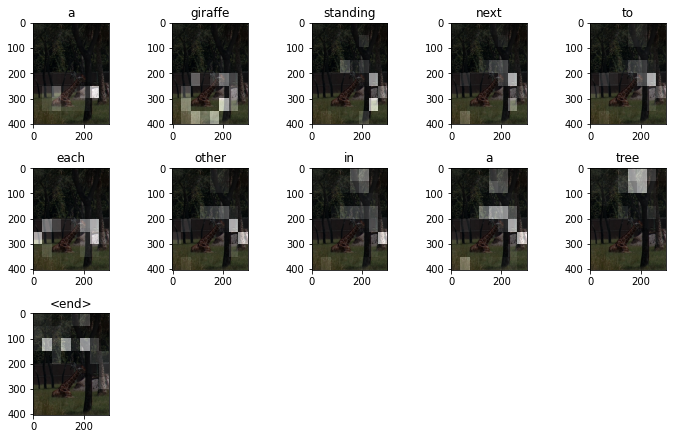

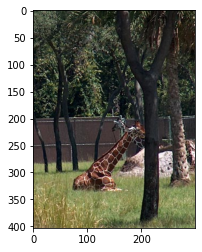

In [0]:
# testing on validation set


Real Caption: <start> a man on snow skis who is performing a jump <end>
Prediction Caption: a man flying through the sky <end>
8032 /content/train2014/COCO_train2014_000000247906.jpg


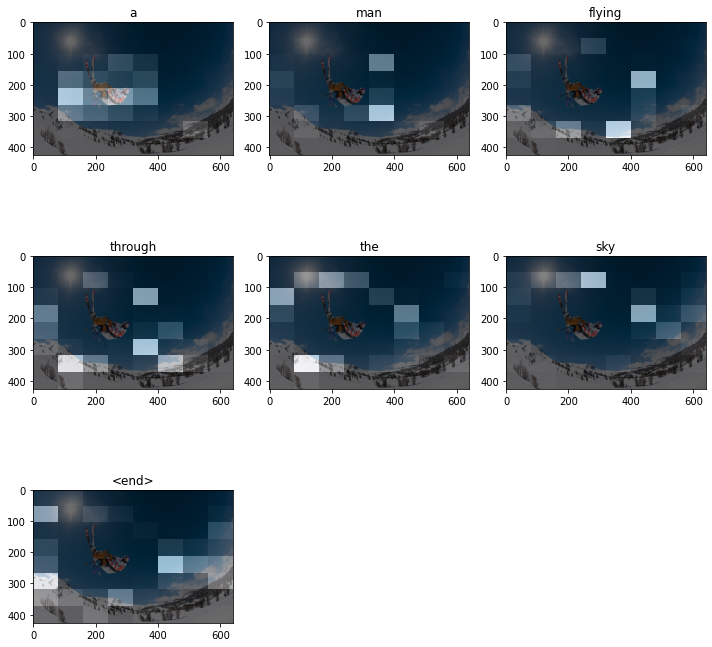

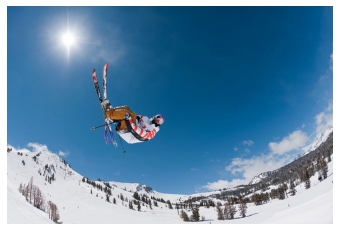

In [0]:
predict()

Real Caption: <start> bird on edge of sill looking to the left <end>
Prediction Caption: a bird is eating treats surrounded by flowers <end>
2936 /content/train2014/COCO_train2014_000000164997.jpg


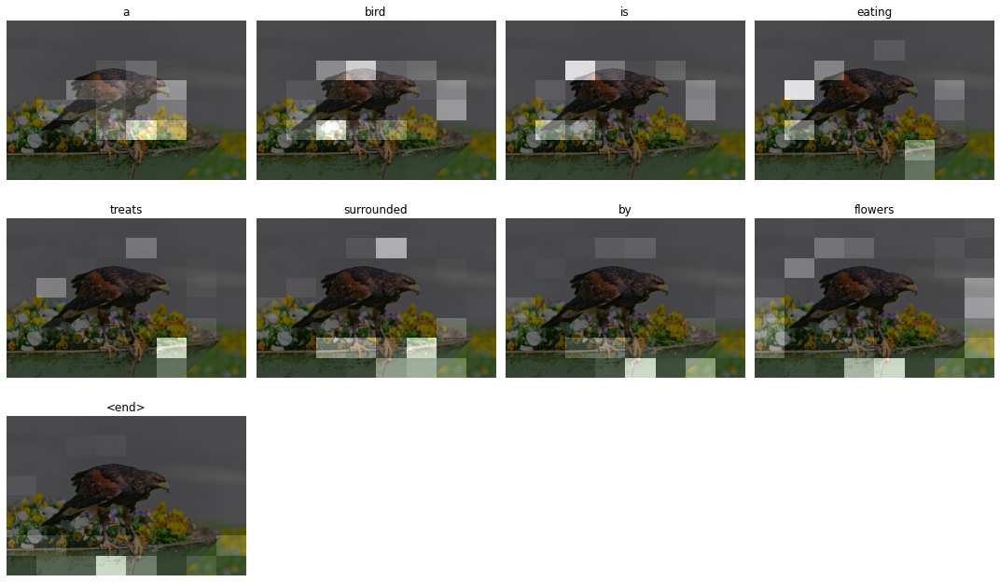

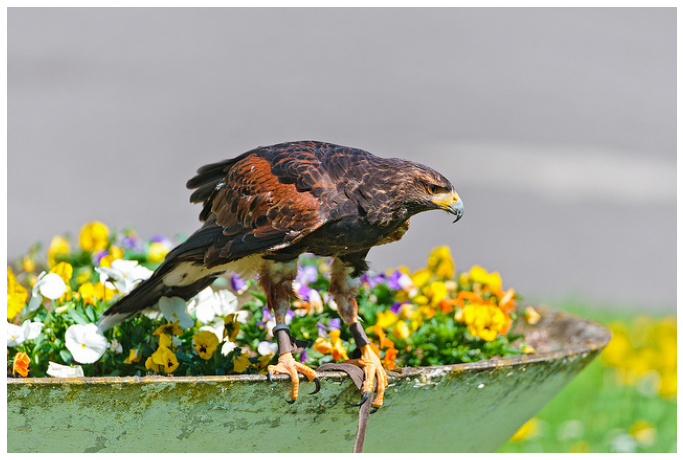

In [71]:
predict(2936, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a empty kitchen that has table with two chairs <end>
Prediction Caption: this is all place also has ravaged curtains flowers a coach interior <end>
6286 /content/train2014/COCO_train2014_000000365003.jpg


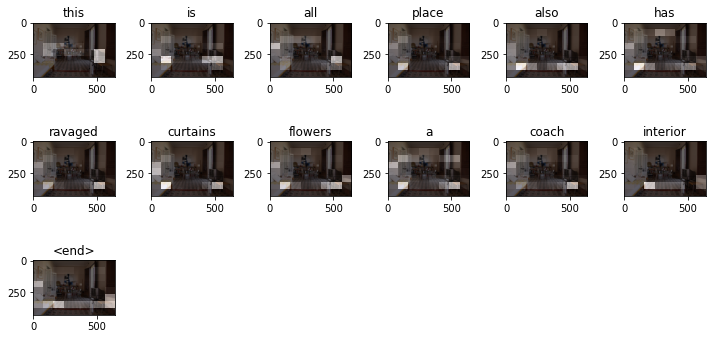

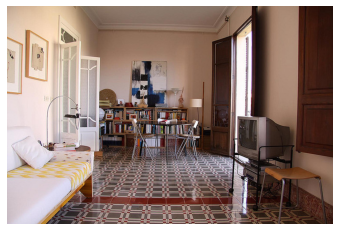

In [0]:
predict()

Real Caption: <start> a baby is lying next to a large teddy bear <end>
Prediction Caption: a teddy bear is decorated with two teddy bear <end>
5402 /content/train2014/COCO_train2014_000000080016.jpg


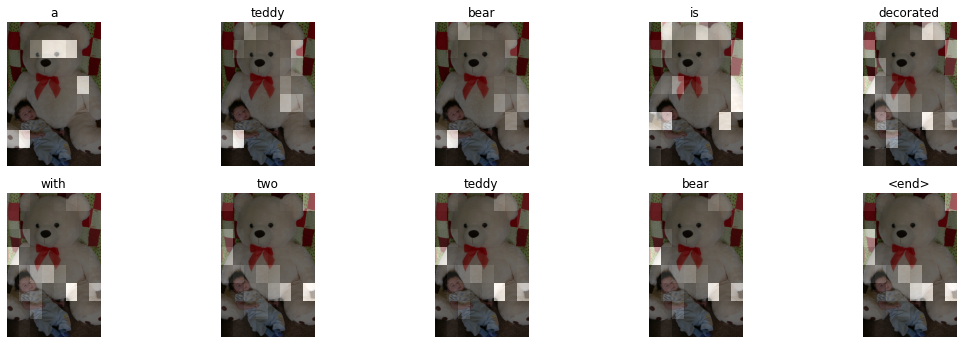

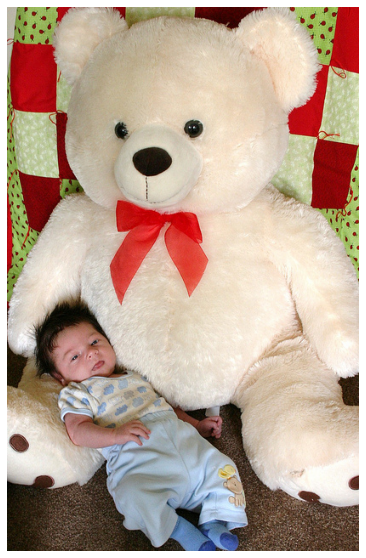

In [76]:
predict(encoder=encoder2, decoder=decoder2)

Real Caption: <start> a couple of elephants that are by the pond <end>
Prediction Caption: a group of elephants relax along water in a body of water <end>
4046 /content/train2014/COCO_train2014_000000080105.jpg


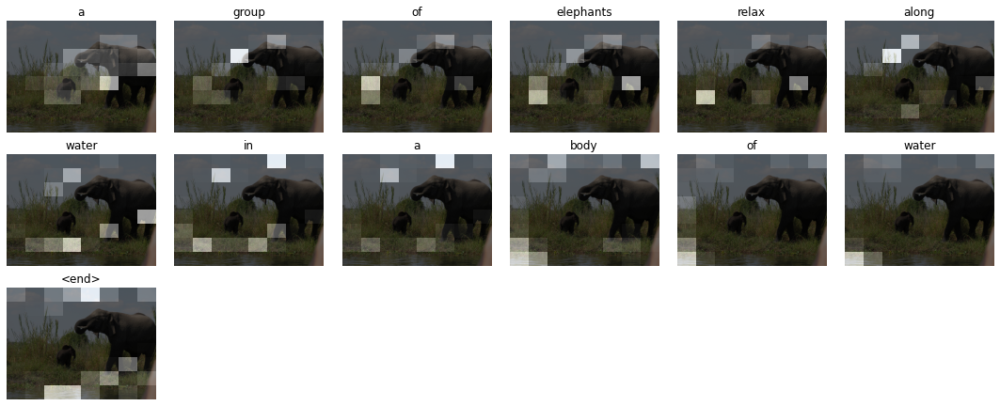

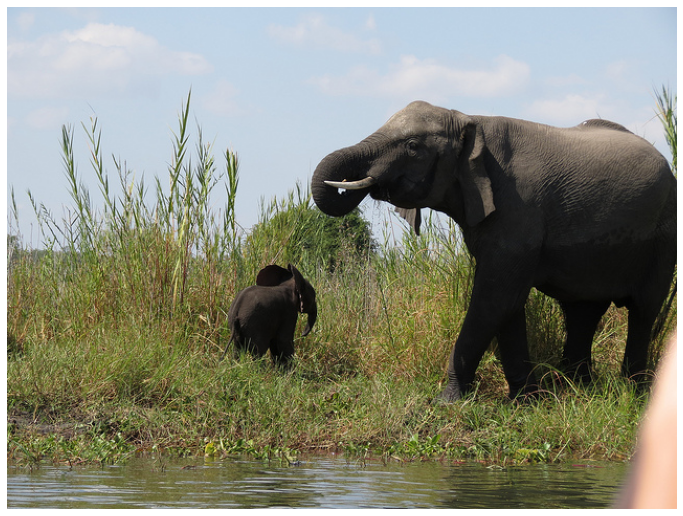

In [78]:
predict(id=4046, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a room with rows of televisions and a vhs tapes <end>
Prediction Caption: desk filled with television on top of it <end>
2187 /content/train2014/COCO_train2014_000000442774.jpg


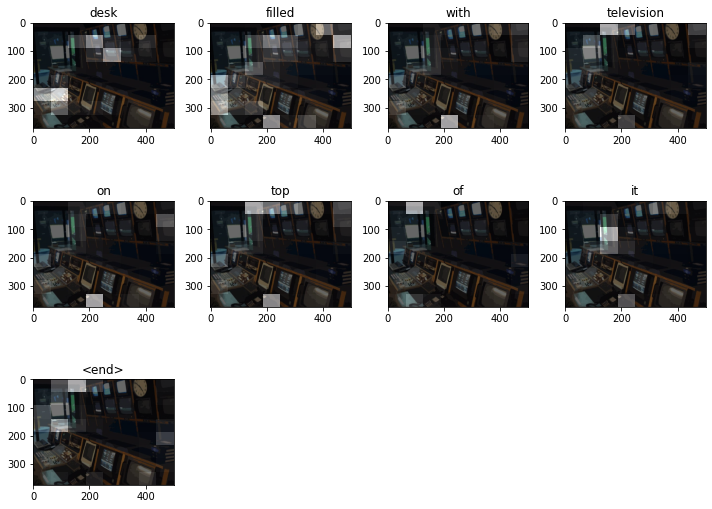

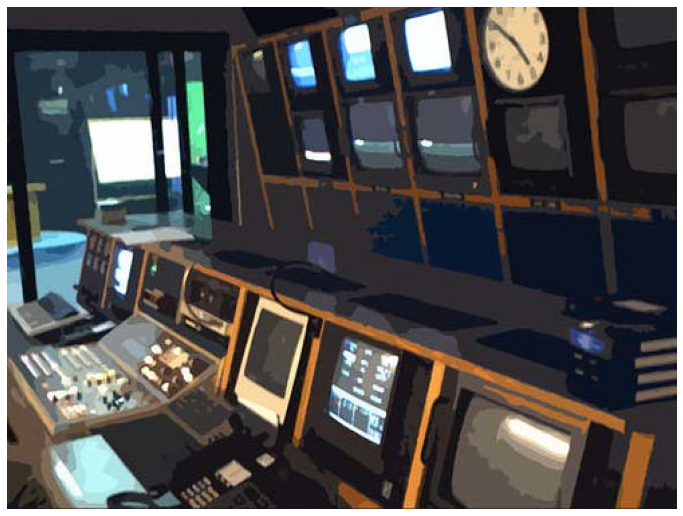

In [0]:
predict(id=2187, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a man riding a dirt bike on top of a dirt road <end>
Prediction Caption: an racer is on a motorcycle making off on <end>
10 /content/train2014/COCO_train2014_000000439268.jpg


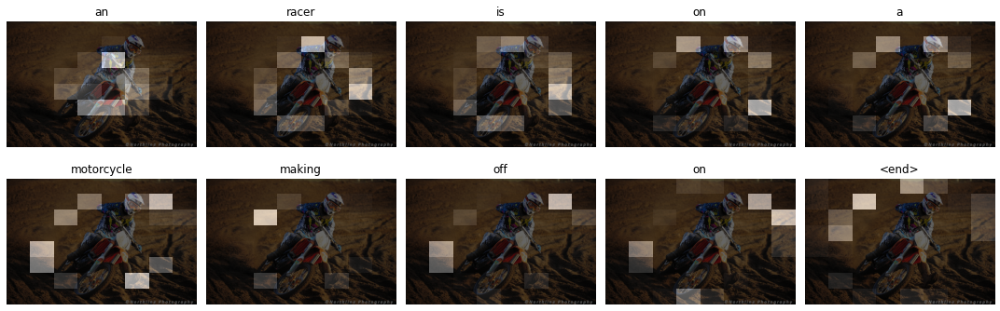

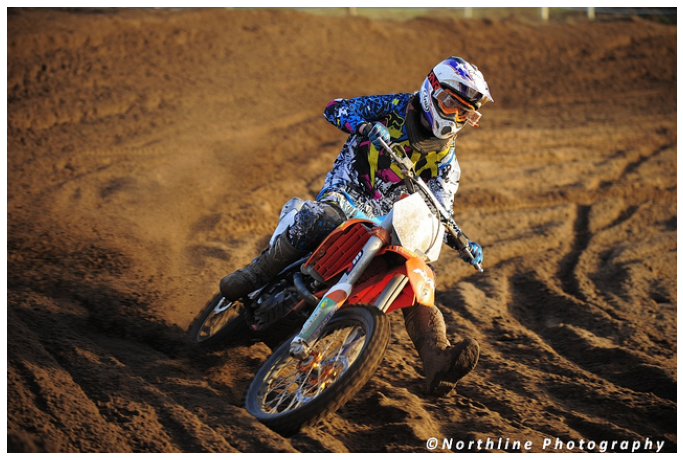

In [82]:
predict(id=10, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a group of people sitting and standing around a table <end>
Prediction Caption: a group of people sitting at a meeting <end>
882 /content/train2014/COCO_train2014_000000468125.jpg


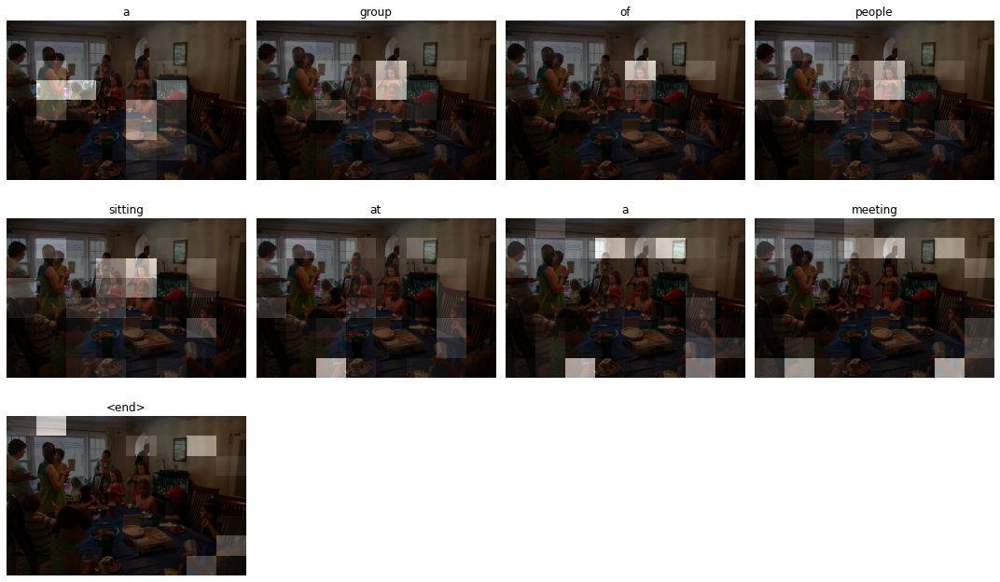

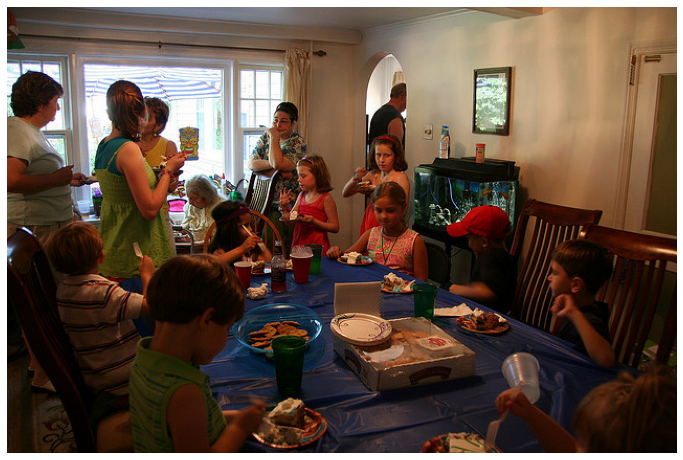

In [83]:
predict(882, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a red fire hydrant surrounded by a lush garden <end>
Prediction Caption: a fire hydrant <end>
341 /content/train2014/COCO_train2014_000000143339.jpg


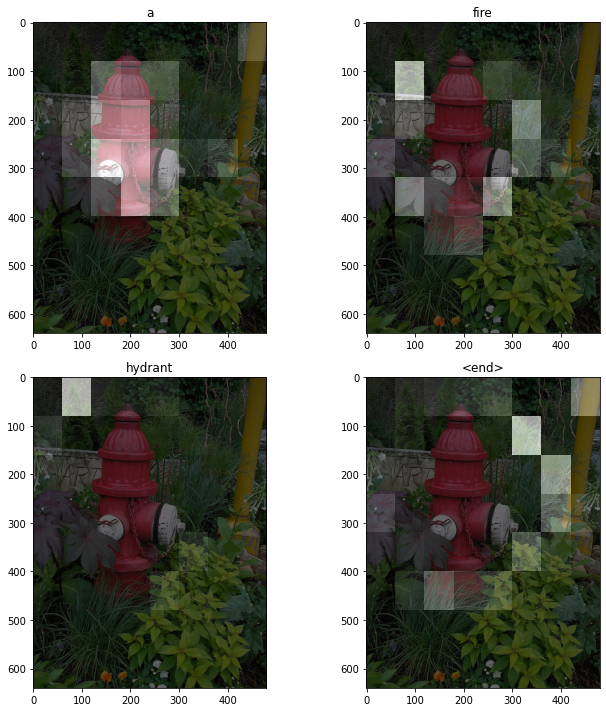

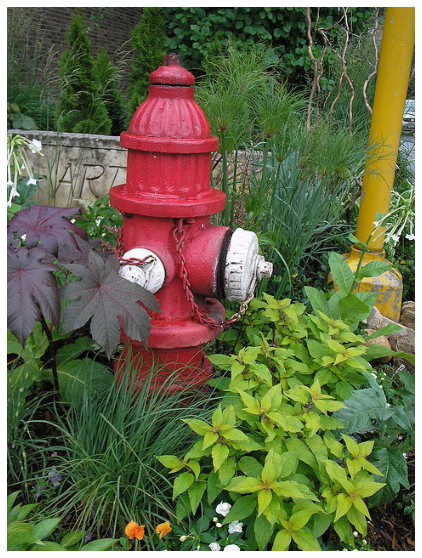

In [0]:
predict(341, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a man holding a piece of luggage with a kid inside of it <end>
Prediction Caption: a man and boy sitting at a video game with his computer <end>
8800 /content/train2014/COCO_train2014_000000283548.jpg


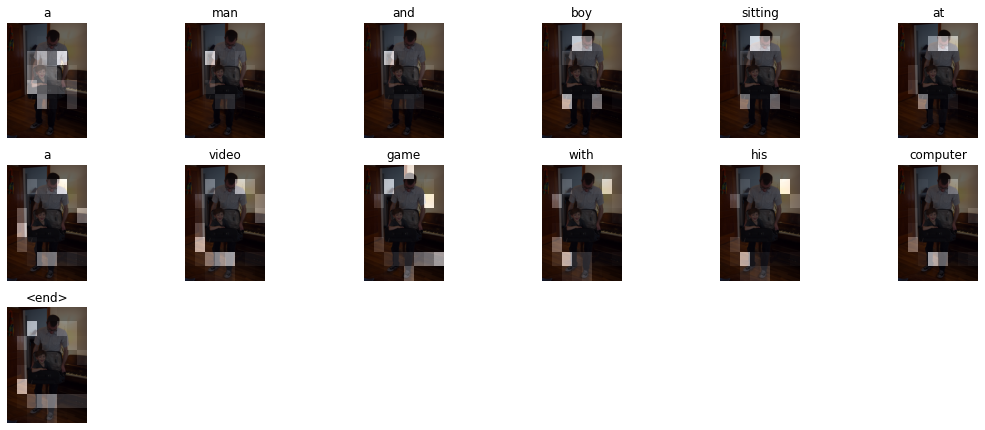

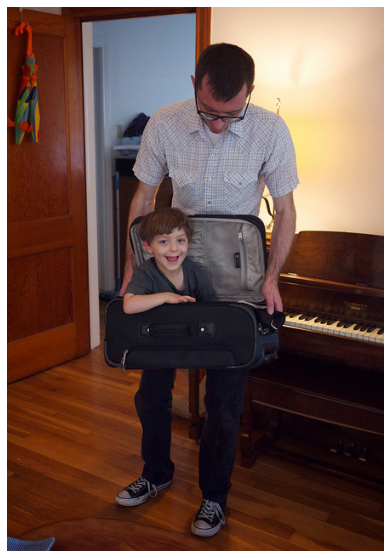

In [91]:
predict(8800, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a train with two people in front of it during a sunny day <end>
Prediction Caption: a train speeding out of train station <end>
6607 /content/train2014/COCO_train2014_000000480482.jpg


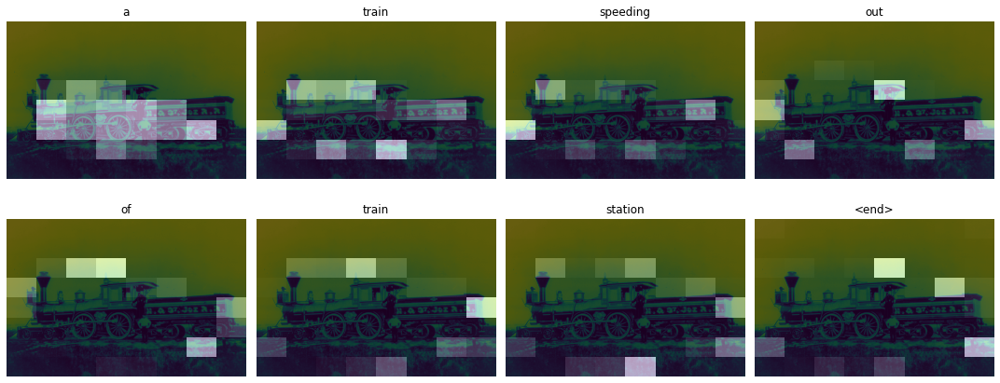

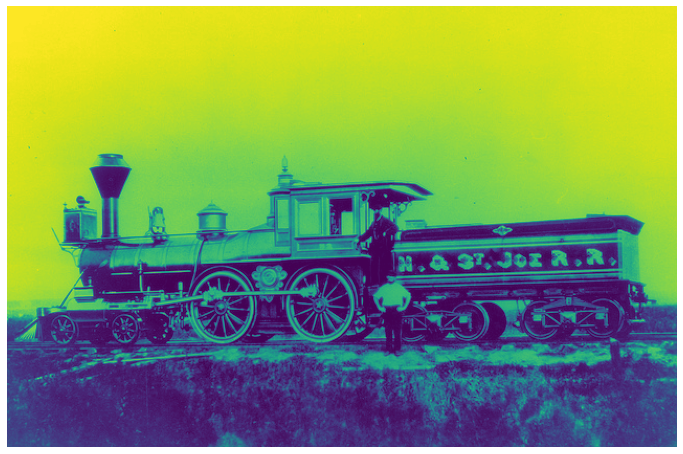

In [92]:
predict(6607, encoder=encoder2, decoder=decoder2)

Real Caption: <start> several dishes of various types of fruits vegetables <unk> and soup <end>
Prediction Caption: a restaurant table topped with plates are layed along by a table near plastic bottles <end>
326 /content/train2014/COCO_train2014_000000419666.jpg


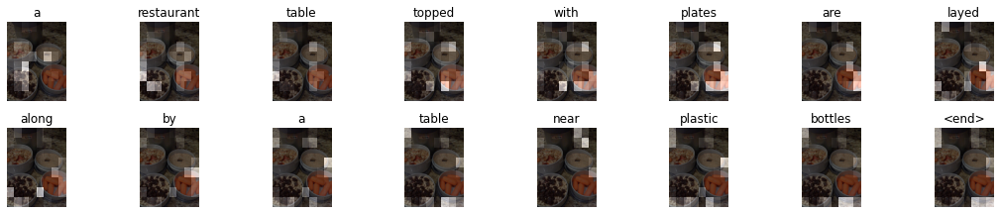

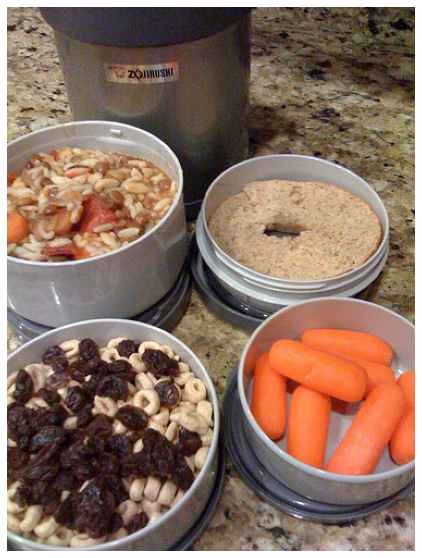

In [93]:
predict(326, encoder=encoder2, decoder=decoder2)

Real Caption: <start> there are children that are boarding the school bus <end>
Prediction Caption: a woman with chocolate and her hands open near a stop sign <end>
8834 /content/train2014/COCO_train2014_000000205283.jpg


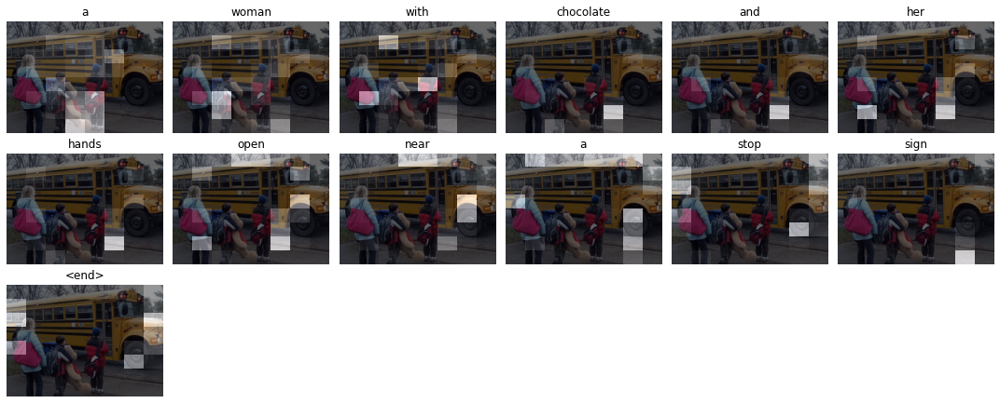

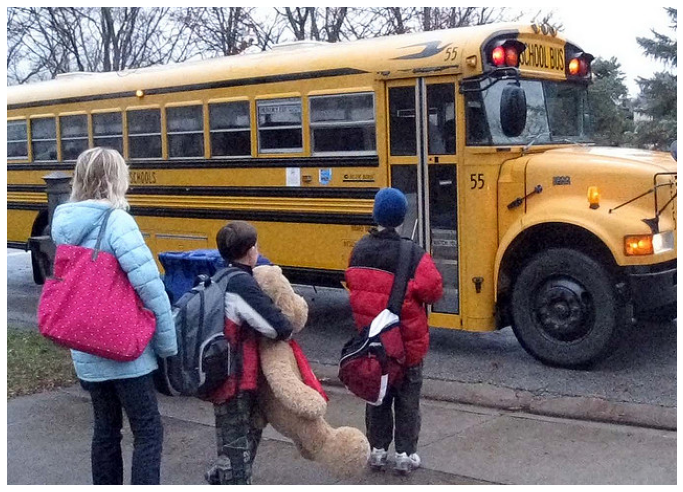

In [98]:
predict(8834, encoder=encoder2, decoder=decoder2)

Real Caption: <start> black birds are flying against a cloudy sky <end>
Prediction Caption: wind flying in formation of snow capped stream <end>
5863 /content/train2014/COCO_train2014_000000514356.jpg


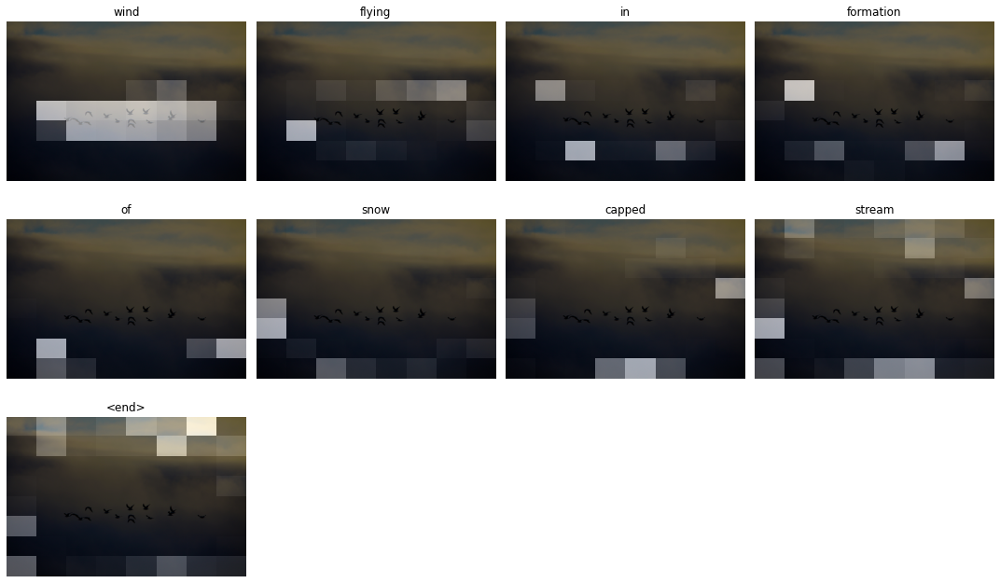

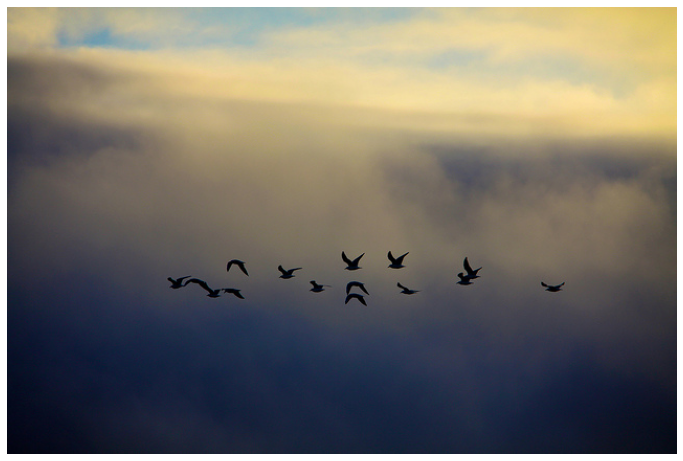

In [103]:
predict(5863, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a brown and black cat puts his face in a cup <end>
Prediction Caption: a cat is laying on top eats on the side <end>
2722 /content/train2014/COCO_train2014_000000276514.jpg


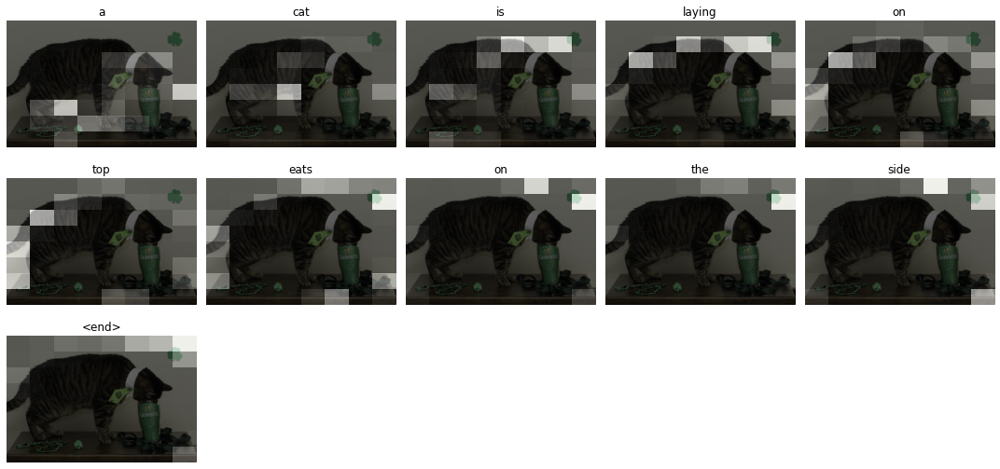

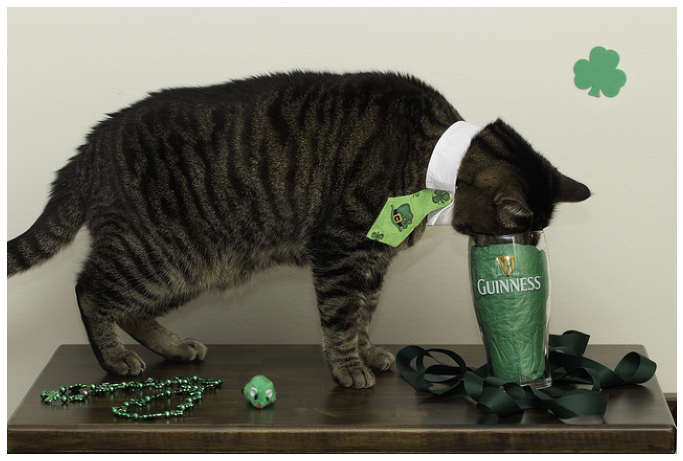

In [109]:
predict(2722, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a woman sits at a table with pizza and drinks <end>
Prediction Caption: a table with plates of pizza <end>
6739 /content/train2014/COCO_train2014_000000081201.jpg


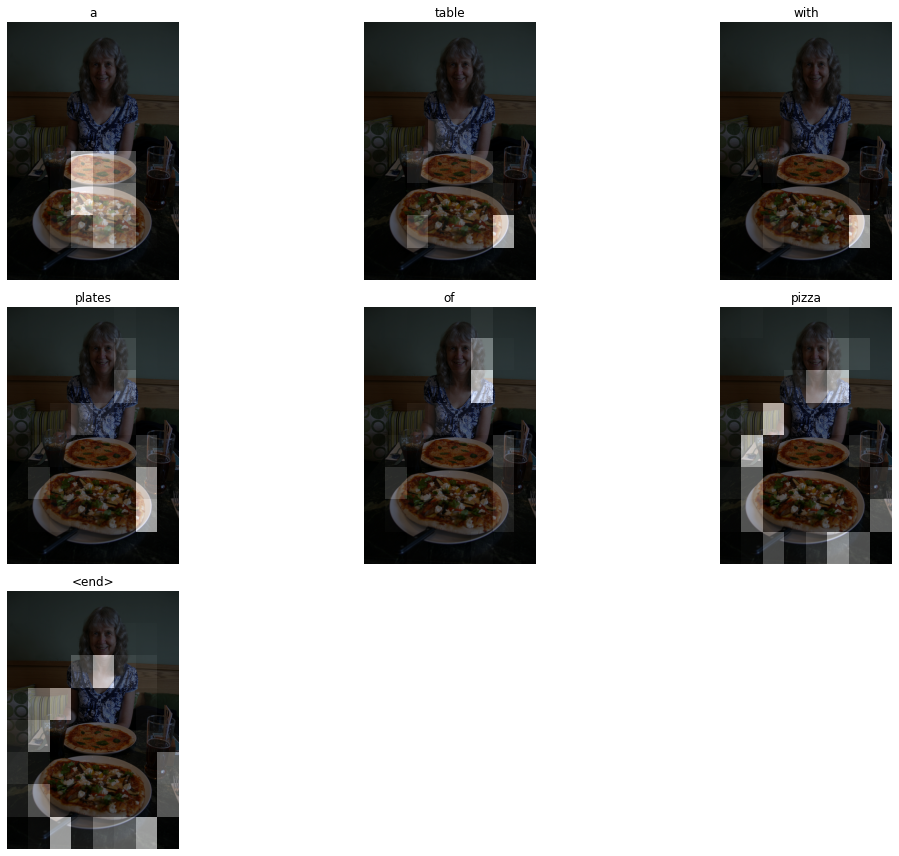

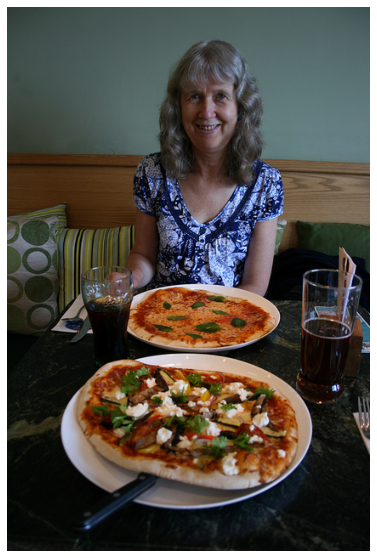

In [114]:
predict(6739, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a large tower has a clock towards the top <end>
Prediction Caption: a tower in the tower and a blue background <end>
884 /content/train2014/COCO_train2014_000000576608.jpg


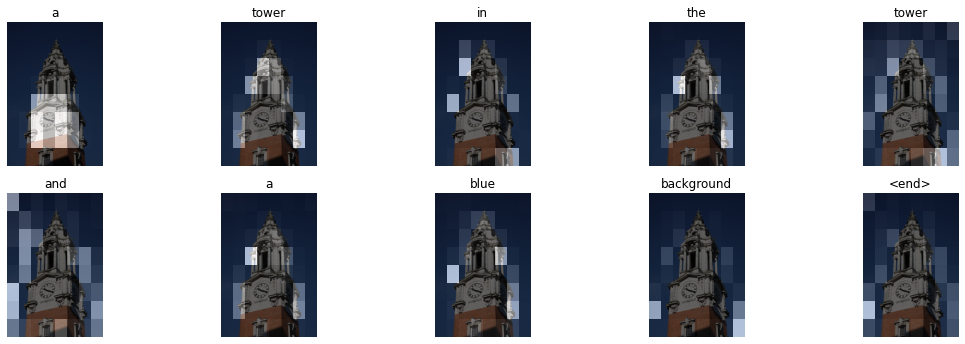

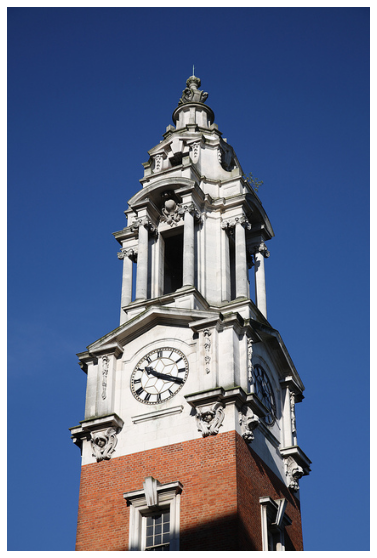

In [0]:
predict(id=884, encoder=encoder2, decoder=decoder2)

Real Caption: <start> a round clock with the numbers 3 and 6 in the center is hanging from two black metal chains with a time of 9 31 <end>
Prediction Caption: a black clock on top of a wall <end>
5555 /content/train2014/COCO_train2014_000000160589.jpg


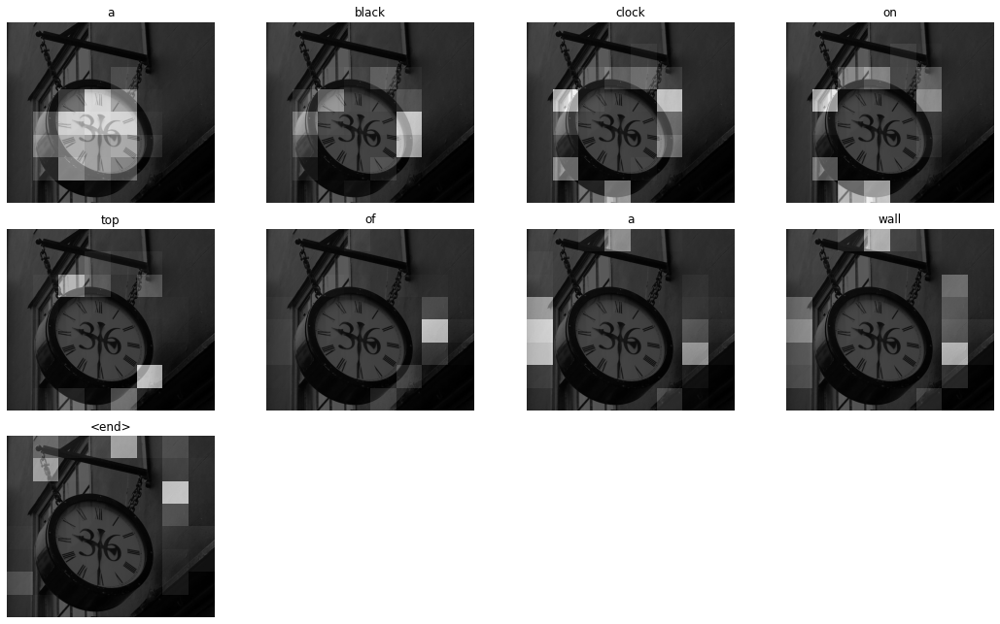

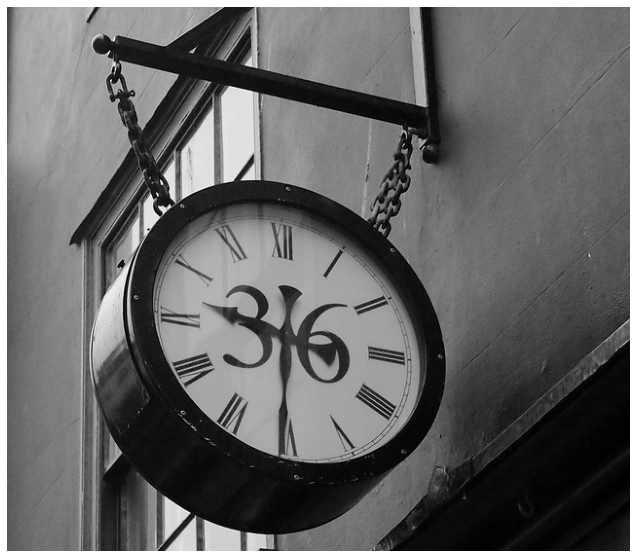

In [147]:
predict(id=5555, encoder=encoder2, decoder=decoder2)

# Testing on other images

458752/458338 [==============================] - 0s 0us/step
Prediction Caption: a man in suit and a military smiling <end>
None /content/image.png


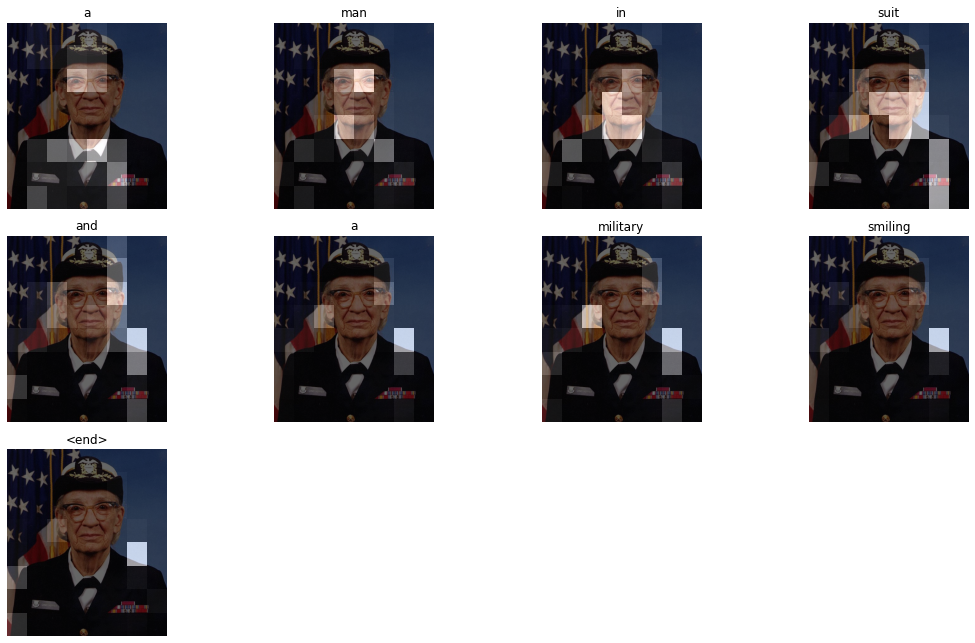

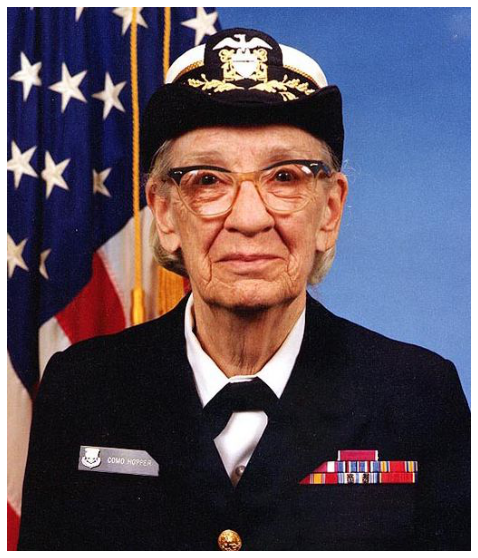

In [163]:
image_url = "https://www.tensorflow.org/tutorials/text/image_captioning_files/output_9Psd1quzaAWg_2.png" #@param {type:"string"}
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     cache_subdir="/content/",
                                     origin=image_url)
predict(name=image_path, encoder=encoder2, decoder=decoder2)
os.remove(image_path)

8192/7003 [===================================] - 0s 0us/step
Prediction Caption: a man is sitting in an apartment complex with long table with a cell phone phones <end>
None /content/image.jpg


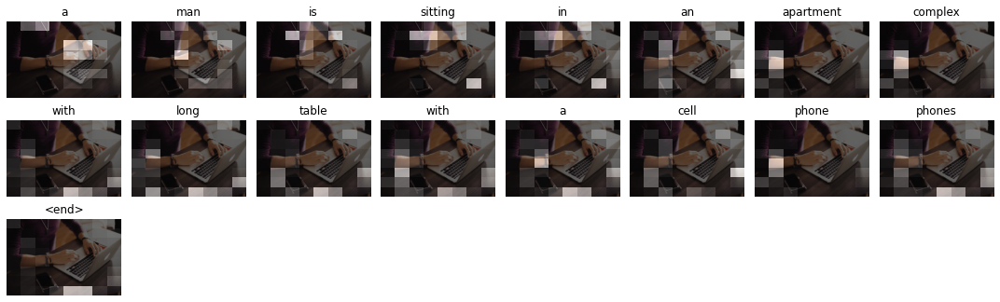

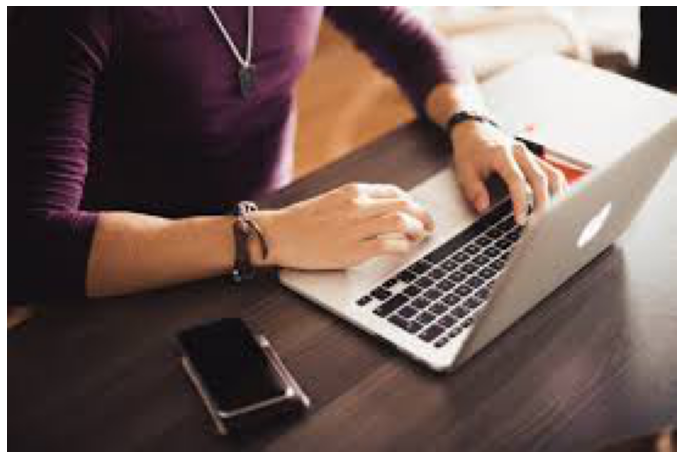

In [167]:
image_url = "https://raw.githubusercontent.com/veb-101/Image-Captioning/master/test_images/laptop_working.jpg" #@param {type:"string"}
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     cache_subdir="/content/",
                                     origin=image_url)
predict(name=image_path, encoder=encoder2, decoder=decoder2)
os.remove(image_path)

16384/12316 [=======================================] - 0s 0us/step
Prediction Caption: various vehicles on both sides <end>
None /content/image2Q==

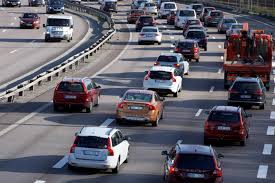

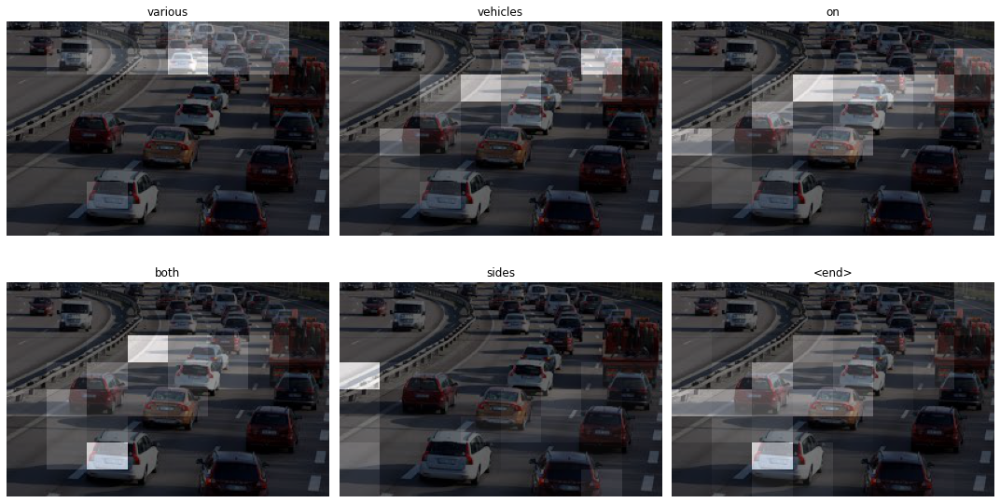

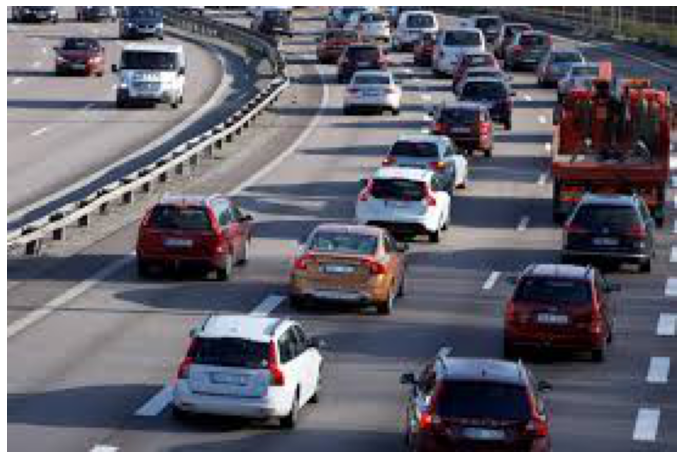

In [0]:
image_url = "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxMTEhUTExIWFhUWFx0XGBgYGB0gIBgYHRgYHR4aHR0dICggGBolHxgXITEiJSkrLi4uGB8zODMtNygtLisBCgoKDg0OGxAQGy8lHyYtLS0tMC0tLy8tLS0vLS0tLy0tLS8vLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLS0tLf/AABEIALcBEwMBIgACEQEDEQH/xAAcAAACAgMBAQAAAAAAAAAAAAAFBgMEAAIHAQj/xABFEAACAQIEAgcEBwQJBQADAAABAhEAAwQSITEFQQYTIlFhcYEykaHRFEJSU5KxwSNi4fAHFTNDcoKi0vEWJGOTwlSDsv/EABgBAAMBAQAAAAAAAAAAAAAAAAECAwAE/8QALBEAAgIBAwQBAwQCAwAAAAAAAAECERIDITETQVFhIgRxgZGhwdEy8FKC4f/aAAwDAQACEQMRAD8AU+k2PuPcdkwt6JUjNbbtDKoKka6SoPjQnA3M7t1mEurmJKi0rgCeUO4AAiRrzPhXYmdogsTG0x8tq0PWRMA+Gf4+xFNk+wcfIudGuJFFW0cKyZULMUDsWYt2cxY5RCg+zO9RdLL16+qC1h78gtJNvYFTEQd8wWmHE4t0Us1swP31+VLuH6c2XP7O1eaI2UHQ89DoPGire5tkLnD8JjDdVruHvtChRnzAAAQBJVgFHdTNxBbpwgtPaVRbJuC40kAP2co7OjTkJgcvSr+B6Wpd7CWnZ94IUGBvBLQazi+IxF6y6WsJczkAiWtgaMD9ueXIVrl3BSOe423c6wPcWAwB7QaH5EgwJ1nbmD3Vd4ZhXuEIiFmMgZA0mSIkAaga++qy9G+JzP0R2SMoVyrJEzEZo3189aZuF8O4ha/aCxbRhlMWZS4wXQKWYwQNNJA08qt1YknBi71ck5SZE/uuBHMCR39+1WrWIvWVYK95D9VhcfskaToSG17xHdFNt7huJG62b6xsRkcDuBiKD4wpqtxbtiQVh1lTJB9rWdVHdUbZSqIbWLw10gvYs9YTJdusLM25YlD7U6yw3q9Y4Ph7rHKmEZucO+YGBus77d1U8TwbrA3V9UzGSDJBEsDt+Ia9/hQjFcPdIFxSDE9oH1hh6bGtaMMGJwtzDHKeq6l9rSlhtuZJMiSJn0pebpTf65gt91XP2IYABZ74mor5dhHWMQAQA5LABjqA26gx3cqpcOwLJeVc2UtoMyK4M90ghiTHKnUmkCkx14fj7mLDG+bmItiALJIMGWOaSBMDTXv2ogiZRFrCXAOahrYH/wDWvuoRwrD3sNcYG/YEzmOQiHBiAitljVu6O6ieL4uwQkXrTEDZbZJPkCRr61Ord/2PdIpcQ4gyume2UydooYJZWkTIaAARMc4G1VOGYIYm/cuNeuG3uAC0ToInuA13mhfF8fdZwzG3GTUsBMS0LBnLsDB763wOMuFOrRUZdSVVRzMxCrIBJ3nnVIzUVQstKUt9w3wjjuMtB1s2GIzSubOxcZhqCWhNNdN8vjWcVxV+yi4i/h+rDFl1yQSVJkCCwOp5/VPpPYxhtkqtloSYmRIMHQkRJ00mrGO4pbxFrqbmCZGQqwZihVlaU6vNrGr5ioPKg5q01yDCrT4AOLsWMNasE2uvuXpZ811wFntQMhH2gIrfhl7B4i4lq5g0XrGW2biXbspngBocsDl0me6psXjsO3t3VXKfYKo7DcEAFTzjbuqDh/SHqLiHqrPVE5utawhYAlgCAI2I2j8qpKqFSdljF9CbYYgXGQgkEEA6jxBX8qHHom2cjr1MakAnMBy7JH61txvpVibZRhcBa6WuPKjYsIAB21zVXt9Lr8yCjTvmtrt7gaVQr/I0pJ8FD6XYRj+3xBglYFtI0Ov1wTt3VNea6dbKvcQiR2dQfECd/OrvE7aLaw+Mt2LYNzrLdxEtnKHR5zwrDJKOk6xPnVbjQYphrYKB87XGUTGpChSOYhTz+dDYZJld7lxVJuWbijmSjR5yQQKiTFW2kdmT3qP0Iq3xDEWcLeyCyGbIuabjKAzCSuVR2lgga9xqLDmxebJ1WSCAWViw15w+/wAKDiu4VvVdzRbQymEU6icrMNge8Ec68NsRor7jZgw2Pdy1onf6HsNbbz4EMh/VfjWtzh14COofuLKc+g8RoPMnnS0uxrfcrYkFyO1sSNV8dvhW2MwpadV9tt/8K+XOo7qYiSRbYqNo198SK2uumUEvDg6hkI1MSTlnupGmuDWVMZg2BEKToBofD1qriLbA6q40HLwohcx4DBQynSZnQeBmINeJi1YSYMGJBNBOXgNoGOI79h9XwFZRtCIHzNZSdT0Y6gw8KsYVY7WSQDrI08jQgcPx5XP1liNtQRJ8BzqNhxECOsw5HdD71WvY1lDptaUiesyEo0hnZVdQRpI0VtdzHia53bFpZ/ZlYGp6wx75g+lN/Sbo5xDFlCzYcZJiC43jwPdQzDdDOJ2xCX7QEzGc/qlMpVsb8fqHOjPB81oXjcVFCSvbGfXMBEAsNSzRI3Bpl4rfNuxcdfaW2Sv+KNPjS/wTo/isOiANaLFv2jEtopP1e8+Y9av8c4MHuG+XfW2LbqumZA+bQjtAzGxFJFuT3Karil8RNt/0ocTH98hgwJtJoJ8quYf+lXiUgE2D52vkwojiui+AGUBMjEEsXvNE5ojtXB4660ZwH9H/AA4ssYlCCwELeg+0RpLHtRl9/hr0SjjyckZJk3Qnp/icRiFt3rViDPaVXHgIlyPhzo1i8KrZlYSJIg+BI/SrN/8Ao6sohGEvXFuzAd3zC3njM0CCWhRGo2FQpYNsC2zZmXslvtEbtrrqZNRk0ysUxRx/A7aNElE7x9TxHMelCcTxC9h3a3di6oMa/ofnTdxthloB0z4P1SrcLgloGXmDlE89RI+NNB3tIE1W6FXi69sXbRyi4JC6SORkbbyO+rOHW7ZE3VUOD1tuYIEGTvoIgSO4VWwgK3UKDOZnLHOTp+s0yvhcTiCFGHCwGl2upCBkKk8oOun8kaSx2Qsd9y0/SxVOt5YIB1tmTI71OUwZG24NRYzpJYa0+XFQxRhHUtvBjXWPOrfDuJphrFpWRgO2odBmVypkuDJJBzR5gjlQi70uRXzpb5yO0PltSpeh79iJe4yXua5ifZ1YiOUaEDnFW+O51KILsxo2VzOYxIOsxsBPcaesZ02tFT+wBldJMxI/w99c74VY6+6WYEIAbj5SJgaQOUkwNRzp4xaZnNNbk6W3tgO/Wr4szjX3609vgkxaAXcdlDIg6tWHthRm7UwdQDG4pdRMC2jWsQ0d98/8Uw8HfBvbuW7Vlme1bNwLeKkBVZQ3a3GjSSe6mlB8oWOpGmmgPxPorhbOe59LLXEBfKTa1KiQIJB5Dal7BcTz4m3mMKWUbbAa7ESPQiny1Za8kDhtgyYFwXFGWJ8wRPhQnHdF73a6vBAP9V0uWjB7xA1pKQ6m1wGcC/YZrvV9XmlCwGimN58fLehbcfRLuQWLTkxzAAmRM5TI0nloZofZtcTsoetw56tVMtKDKo3Y6mYHdG1VMEmYG6wsdo6fSCFWPDXU93gPfValqkTwW8mNeP6QrcW1ZuJaUKWKm1cDZC0AyMgnYaabUms+Iw91utEPlKyCDJU6kQZAgju3o7YxhEQ/DNtlYD0man4pwdcaRcuNNwdmbJDDZRO5CkCNZ1ApHHuMpKq7iraxQuGXuWyR9plXSdtSs/x3orgrgM3BAW3tBJBYaDXMQRMc6st/RwF9nEH3j5UPx2MGG/YF1JVxJnmBPuOceo8KWMkGScnbYUXpRfYmLUmT9RoOu++lWblvEXbZuqlxCGAZYcTmBgrPiGB/y99VOFv1v7ZsotgGCD7TLyAiTqIMVZsW7gQG5iT24KnNc56jSas0qtfwR+V7lIYDEMZyuT+8CfzE1RuYcnf4H9D86aOEccsocj4lXYvIJLagAadrXcGhNjAvcUujaSRqwGxI5nvFRjqW34R0z0VGMWuXygLd4dP2W8Nj8f0Jqlf4WdgCD9k6fA60xHCtoJXU5R2hqZiBrqajfUAFgw7m1HpO3pTKUZ8OyUoSj/kq+4u9ReGmvvNZR0/5vRzHxBryjQp0w8ZsffJ76wcWw/3yfiFRNwXC/dr7yPyNQtwDC/Y/1n51L4+yvyLg4rh/vrf4h86w8Vw/39r8a/OqH/TmGP1T+M/Otk6J4SZIJ8M9b4+zXIurxSwf7+1/7F+dBum/SQWMMhw+IQObymUZSRCsZ5mBFXsR0Ywrakt4duAB4DYUNxfQzBXBBDnWf7St8VujW2K1vpfauW1bEZ7l8MSXgagsTM66+lG+D9OcKjqSLnYjICDBMkgE5dBJnerS/wBHmB3Y3P8A2Vf4b0TwmHYtazBiIkvOnrTPVYvTQe4d/SLNk3rpjKdQoHagM0LrziJnnWXLwVZJnT36UEv4XDpdW+dbiAqpnkdwQNG9aJG8AvW4lgiDZObefP038qlux1secNw5uN19wfs0PZ/ebl5gfn60r9LeKJfuZerkrpnJIA8BG4H/ABWvSDpjcu9lOxbGgA7vShWFtE5Hui4bbsUVbQDOzDlG6iSBMHXYVWMcd2Tby2RDhLRVutDtbtIQHvZCQJ5BRq093qYpkt4brequ4q1oYaxhpzG4SVVrz9kMlnVCZ35QPa9w/B+pdHvKl3FwVtoqxbw4Vc6m9lJD3O0DlH2p10IsYnh18ubq4lusbfMAddJAMAhdNqSU7YyjSDd/FHsZyJ0UbKPJVmAPAawOdDcdaBOwPoKGXsDjAT/3CH0+a1BheG4644UXl8T3D8NDH2NfocMFhl6izKrsx2GxaRQTpDhszZbdw2yIkKqajcb860u4DiU9nEJAEDyH+SlfjvQviN+4bj37RmN3YagRySKdVF3YLfgOLaug6OYG0uAdhvCkd+1OXQjBXHuFuvAULBQqGzSNdTBWuOW+geMn+3sgd/Wv8qP8L6OYnDgXLWPVL6nT9t+z3iCpEnsz6009XJVQkIYux14/wO29+4y3LqjNEI8ARoYEGNQagudG1ZATi7wI0y5oY7DeNe+hbcJtMM13Hk3Dq5V1gtzI8JmocXwvLZJsYxLnahka6A+WNSkSWbYAd9LG/P7Bf2Jcf0QR1dPpd+SsQzgjUGMwgSPCud8d4ZiWYDq2ItrlkK0TMkrI8hp3eNWMT0jxCXGFm6cohSQNdBqdd9Sa3sdLMXJK3WInmPlttVYryxWwJ9DvACUbu2189dY8dqNdFnbM1o5YuLBFxsoJkASRJGs7Ci2Pxd+7gwwYFyHJKqCQFcAhtzqrEjyEUrdGrQONsoSDmdQZBGh1O8GdaDlGthlCn8jomH4Jw9l7V60rBZIN4wTzCkn3TvQ7FdG+Gtr1lv8A9p/3U1XOjWF+5H4m+dZ/0hhsgc2gVLZfbaQfHWpZL2NT9HMcVi1sXHs2srWUYEEMSDmWY5883OrX9etcVbZtLBjKQDO8aSx3Og9KFYhLbAkmDIK5e45sw9OzQ5bu8HYfEUkpNukzph8IW0nfklxtzNfN7q8q55ImIIg7Tp5UfvcWR7VpLU+3mOusBwSpgiZB/OgN42+qMxn8jPtVrwa2oujOwAKHU8pUgT6ke6tGVqhJrGaa/wBsZ8LdtOXuLZLBFz5c79mCJYazpI7/AJX8Jh7N8MuRrTEKAA+6tAmGEg6mDJ1FKGBxbKGgnVCu/JhRFMYzBZcgqISDqO0NoPhU6lHhnQtTTm3FxXev0CKYNiBABEaEHcefOsoXicMxZiqKwk6kgE9+mU86yr9Y4+idnyk1PZCASQWbu2X1I1Pwrwmoy9IY3Z/TwFR9YeVbC131IABRARC0TvUgUCo7uIA50LxHECxy2wWY7ACsYI3sUq7mh/0p7py2lnvPIeZ5VSxLWrWuJu9r7pDLevJff60KxvSW7d/ZYZOqSDopgxzLOYCjvOnmaZQbFckg3jcdZwYkkXr/AHckP6fn5UuXcNjMaGvsItKCTcfs21A5LPteSyaL8A4BDowspjXMlu3FmyREZmykXDrMe4HeiuIvYaxipYfSMS8vpHVWsqn2BpPsxrqI+rzbJR4FpvkDYDo6lq3axQvLaUS1y7i7Qyxpl6q0TqZ+sxE6R3VK2Jti/ikwCBMSYNzF3NWYvqwtjXqxE8hruNJqLiCHEm79LN11crlgN2Y6zYAHKII/WmKyc4mIB5kH8qlKTbHSop4XhVtS2RT23a4xJOrNudSd4FS3baJvJPLU6T67VNevqui+tUArXGyqMxP86nkKWhiJlLkBQSToACaO4bBC0uQElj7Zk/hFa2MMLQIQg3ToXI0XvA+dUbyYyTlezHiGn9adKzNl3E4G2+jAkeZ+dC8TwLD/AHf+pvnUN/6cP7yz6fxWqLYTiDGetX0gf/NMk/IrfoJW+jOH+wfxN862PRnDfZb8RoS2A4h94fR6C9JFxqWij3G/a9gS5iNCwnaYIEdzHwpv+37gSviI0Do3gnjLcUkiYF2SPQTWuO6M2VtRhxb68Gc73DEa6EBZ7hvXKrnR/EAf2Y9CP4VsOH4jQmyQRzGUfEGarg+9kslynuGeM9GMTaT6RcSy6Bu0tu5tyBggNl03E0Cu4y2w0sIp5N1oMa9xOvdXUBYxGIsYdFyqrWwLzO4ALRlg8yRBafEUk9J+gF7CFTdVQrt7VtpULJzLqAc8ZSBtE71OSx2XBWOq5u5chzopeP0UGQBnkgMSSFJ+qOzHjM6DxjzEYjCtdtXSt3NZfOsLbWTp7WXUjSg/C7/UXLSWndrBabhZFDKAZ0I38dOVP3/U+G5lvw1GEa5RfW1c634VFJ+mafdt8PnVZumiT/Zt8P8AdRJ+kuE8fwVAvSzCJnyhSXtsnatn6w8t5inaX/EirvkR+mtsLiQFRUHVKcqgAalidB4mgVjAu5K20ZzBMAchvTz0l6NX715r4a0EyLu0EALJnTTWaE2+CXkRLoZQGBAAch4IIJiNAR+YqEU7OyepFwruKV86D31qVIYjy/Q1exuGdXCBS3IgST+XxraxaZnysrA+O5Hu+O1VUWkQlKMpWRAkAEgwdJjSQNp761OK1TllO/qDREm4Ee209U8aEgwRsw+yw7xvtQvD4Niygjcj4kVpLYGi6nZ0tej+H75mTy5mayjGJ6E4t3ZssZiTCqIHl2qythE3UkHghO9SrA2qO5eC7mhuI4pJy2wWJ2jU1hAldxAXc0LxHE5OVAWJ2AqLEYXKM+Kui0vJZlj5AfpNCr/SoLNvB2cpOmdhmc+nL1nyplFvgVySCmIw4ResxV3q1OyDV28AP+fSl3HdInMpYAs2+cHtETEu5218Y1qZuCYi4ys6m/fuf3QcSi5SQ959rduQoyyDB01EU8W8NasYcpiVs2xGZrOHntFdYZ2Idtu4bak0cox9gpsRMD0dNy2bgZcRckRh7DqWIJEl3mEAGv6ij+J4TZw+DniFm2FSLhw+HOrsNusuE5mInaQuu5qPhnSPrMIfoeHTC2i7IoWAdFXtHKvtHMe86b1DwnhLpYVHYXDmZmYySzM2g1mTtJpJTb5GUUj3inELuJwdtbKrh7bqCLayqhNezIAkbeBqzcwys4dVJIUrPP3kzEN5anuq+OH5diuw1BA5bb6+cVCmHuEDLlgjSGGvrzoYy8B2MS0qe0ZPMTt76zEY6dtBWLgLhEkgDlzLeQUEkeMRVf6RYtN/3DHNythG+Jjaji/BrXJPgsE13WcqDdj+neaK28qLltCBzbm1LOL4s91oTFgLyQWSI+BJqvcGM3F5iPJh/wDNNgLmNwqO7cikjEYjFj+9b8RFDrgvse1cJ87o/VqPT9mz9HQMpY/wqTqn5N8K5u2Hud4/Gp/Wq9xLn8mm6XsXqeh+xHElXNOLtgIe2ZU5JMdru10156VMMRwJj1tzE2WuECWNzUmANh5RtXPeL8Ob6PcTDgu8r18HUxqFUDWBLCNzrpoKTjgrymeqdTvsQR76ySHknGt963R3zBcL4LfJFvFqWMmFxWvoGO2vdWvSHoRhUw966b93q1AILsrgsYACnTSSJJP5VxFMSSsXGPqgOm3nTl/R1hVuWsRYZ+qs38uS6y9jrEdYnw3EzAJHlWlNpA0tNyl8dnyjz6U9sFXdrnVrktrMZIBAWIEEEzHhT3/SRcLWLKlSxkORrGqkTpz0IHrQTpX/AEfvglt4psQLttHQXBkKlQTGf2iX1IEaHWe+ouE8VsKzvcxt261wgnrQTETosKIGu21JsklFbejbybcnuAUw3/hH+r5142GH2CPKf1p4XjuE++X1B+Va/wBd4XX9snuPyplqPwDFeRDuYRfH4fOtbvAz1PXA9mSqjmWjl4fKnhuKYSNblo+cfrW68WwzBVN61lUyFLLAnuHKs9RvsFRp3ZypeKOgKi5prIMHmQdx4Gvf69ufeL6haqYPAdb1jZo7ZM+E98jvOlXsL0Xa/ORgAIMsT6DU8+/lXOopyxR2vVkoZv8An+q/crXOJuTJuCfCB+RqH6e07ie/v9Zq/wD9I4hfa7X+Ekj0qN+h2LaSqAgci0H4xPpTrTmuzJS14NXaIfprcwp8yf8AdUmGvksgAUQw28/Pasx/Rm7a3XkOegbXMCY1ggiRpIOpqTo7glOMt2zMFZO2+Uz+tCndMfqLHJI7BZ6R8VdQ6paKsAQZTYjxNZXnDOD4nql6pzkiF0tbAkc1mvatcDjqXop4nBhFNzFXsoGuRdSfDz/maDDpBeuHqsDYyTzUZnPiSdFHnMd9XsV0UZVZ2ZsXfBWLCtAMsJzuT2BE6z79qL8Is4ixZjEPh7AO1uyAp3+2QO1HcpPjS3Few02JeFt2BixZxLXL98vle3ak5Wke24ksNZOXaDrTfxvg+G+j58Wy4LDje3aK5nhgcpIXUkqNAC2+1DsT0qyY21hcPYtKLsG5c3ZpzTMbtC7sW3r3inD/AKUv7V3uCQdwJI8QJA15UspN8hUaLHEcaPofU8ORrCXEUowMMQwBkknNmynckt4iq2H4b+zVWB0EEZzPr3zqTrrNXrFpbaquyoqqJIMKqgDU7aAb1Hcx06IsfvH9B/I86QYmw+ES0oACooO2g1MT6mPE1z3ph0svm4Ldi5kVe1KbtzUk8hHajxHkGHpJiCmHuNm7RGWe7MQDHdoTtXNb5VyWYsWYyTC7n3R7qaNKRSMG4OuQnh+kOJDyMS7jScwB7pMe+r7cfu6ZcS4BEZeqQgCI2J/Wl2zhSDMuB/hkH3VJnI3PwPzqu12Tx1KpHTug3SEuty3iCD1SmDESoloI56EkevdVHpBxpb8XAkKjAFZjsHx5NIbXb2aVOj3E0tXTmOZLgCtCtIGu098ketMtnF23tZEsrz7PtEAxMlp193Kk6nKZZ/SynjJbbU/uv7VEuDwti+zDDYgMygNBB2Pcw0MbGNq3fhGKX2WA/wALkfKhSm97FoXAAAWCTpMwOz4LUbYe99Zbh8w361aLclyck4qLoOW8PjxrJP8AmQ/nVn6bi1HatzH+H8taVXttzU+6vcGqnM7yUTcDcnko/U91NgLkX8e9242Zkb8J0+FU7FtusSVPtCdDtOvwotb4thwQv0NZ2iJPxM1P/WOFE58IR3EZh3yNH15fGjTRtvIWuLzBHv3qIYJWbMTBIAJB5CT+poZjk4ZiyOuVxlBiGuAKOZ5qPPwpU6X9GlwhzYe5dZIBILCVzLmHsxpE7jXKe41nquO1A6N72dGXhSk5usUnxKj9BTL0e6MpfVlxKB7Q9hA/M7t2DtHImvnHD46+0C3cvkkwArNqe7Rq6R0T6f47hdsjGWXv2SwALXAWQwdAZOYGOe0VKeqpLEbTjKEsk90dA/pcxk4J0E6XkTzCgEn0JA8xXFwK6Slt8eRfvuDauWkZLKz+zZpdpae0czkbDRV7q1udDsOdsw8m+YpYaiWwzg2c3Y1Fcauh3Ohlj7x/evyqpe6G2fvW/wBNP1YgwYgm25UsAco3PdUWc99dHbozaNlbILCDLMCO0fKNOXuFVX6F2Y9p/h8q3UibBnNOG3czdWikux023qxjOJOp6q1cZUTs9k+0frNO5208AKY+NcEt4NTcRmllIOg2JA07j2t/Ck651caZge6B86EZIZw25/Bds469EnEXPfV6xxO+I/7i57l/UUItWiQSVubSsKd/HwrazfggNI85/jTuTXcmo3sO+Kxj3rdosx1DWmIAmT2lfTnOv+Xxpc4Uzdb+0c9YAQVO6kd48vzohwviA6u4gYScsamdDrGmhIkepona4GpudeDJZQOXcPjpUm03l3KuEofG9udglw/j+It21RFBUTBKsdyTyaNzXlMXB8ZatWURg8rMwikaknfP415T5exafgg/r11BfrzMGEQBQO4QABz3AHjrrSl0aulMz4pszs+diz5mYquVRoZ3uOd/q0DljvFYTHypembM6Pg+J2ANLq9+uUen6VBielFlDAdSe8CQPUD4CueFyfCtay0kbNjzc6QWGMtckjbsnTyEfxqRekGH+8/0t8qRrOHZvAd/yqU3QmianvpukgdRh3prjUfDDLcGtxQVgzEN2tREAxp40hZ/5BFW+LMzIZJJ0oMIjWZqc4K9i2nrNKg3Z41fUAKRA20X+ZqLHcRvXQof6sxCxv5UIS6RPiI/L5VqCaDbfLMpxTtINcIVetXrVYoDJywCR4TpNO+BZkJeItskDb2gwHeYMEUg4KzdS2bwjKOR3OoG3LenDBXPpWEtrLD28wU/vaCe6ADp30mKss/qXiooeuA3U6lGJAJBB8QLlyJ99E/pKfaFI/DcJ1VsIgMCrDXHHI09I57Y3vibcEFhBEGe46frSZxL6KXyo6ogJhQHOZiInMAdRJ3GunlVfG4o5chJXrDE6nbWq6jSGcNEZcugAAAAid9JnxpXNw2RaGnpyjcufH8/+bFu+ll0KtcUSQQxZhliZiUA1/Sor2CtMIS+g/8A2Wz+bA1pZuWgSHF5hOhDgnLA3k+1M1mLawQera8DPZDhCPHNofhVM5JXaObpQusWTXeA3nACLKkhcylTAJgkkE0c6bdHrj3FuW2XJ1SI0nZ1mBHl+Z76TrTujzaDEsTmydlog8xGkxptpTjhbuKWwFxQysgB1K6hoyzlMZtfPUVzav1DtX+Du0vo9PC4v73z+BWw2Fso5bE2bWogIlsHnOaSBlO4jwFXRcwLaHDSN4IEe6agv2Ve4zNJG2/PefUEVv8ARrX71dMYprc45bNpB3D9I7VtAqIQqiAoAgAchpWl3ph3Wve3yFAzhU+0fhUT4Ifb+H8adQgJlILXelz/AHa+81UfpY33a+81RscJa6620ILMYHzPgBrVfiPCGsuyNctkroSGMT3SQNaOEQZMKDpQfux+I1q/Sr/xD8X8KE20s24a86mRKqGjNrEk8lEHbf0NHcPe4TADZWPMlnEnnoDAFFacTZSFfpNxsXlCf2ff9adR4CIgUs5E+8X3N8jXTBw/hF32kEyQP2r7T/iqpjuiXDjl6l3LM2ULnBXUHU6Awu8TrEc63Tl2Nl5EyzxK4IAvjQR6d2tvXao8RNxsxuKTEA51H/yBU/GOjrW7zW7RLqGYAmB7Jj5H1rfAcHZZ6yyHn96I/jU3N9xlELcFsMLTT1BHZ7Qu2ywieQedeendR/Bt2BDkAaQR3GPjE0n4vhNwwLNvq1I7QLzJ95pwVgdOZ896W7DQ8YXotZKIWdsxUE9rmQJ5d9e0qfSsSNOsvD/M9ZT2LTJ3sK31FA8FE+pitxhU+yPcKz9psMh99EsLwi4RmusiL3STp+lSKA61wxbhhUDH/CP5FEk6O4e1DXQrNuFCj8ufmdKtDFuoyWVQL9rUT7wfeahTrBqUUnmesP8AsrbgK+KwQu/VRV+zlHxNB+JcOw9qM6rrsAp/4pkzv92PRv4Vo7GINqR5qfzpk2BpCNeXDH+5n1j9TVK7Zw3/AOOPxGnHF4K02+HI8VKj8mFCrvR4MZUXF8wh/JhT5RFpiw9iydrK+smvBhU+wn4R+tMh6NsPrH8B/Qmom4A/f/of/bR+IPkL30S392n4F+VW7N8oIXsjuAAFFBwC6TCjMdJAV9JmJ7PgfdUj9EMXyssf8rfqKaogtgduIv8AaNYmMxDAlM7AaaCaN8O6D4l2PWIbaDfMQC3gJ/OrHHbbYZRbRBmjSCCFHeddT4e/xZKL5A5S4Qn4nijq69aSI1AYEfxosnEsPdhesXPA0YEDyzERS7xLhV5+0QxMkyeZ86Gtwq8BHVn3GoSgsrospuqHxMBPsm2eXZedfw16/D33CEjfcbeZI99IScOv8kf3H5VNbwWKHJwP58aVxh4Cpz8j7w9QhzBkiQGjUjzEz7tKK47FB5BaY/ak7aWyvfyEz6VzfCYBwDmN4E69m3z8Tz1or0Tw98m6t1XCvbCgtMCHVoHnlFc8tFSmn2Lx12oNVuFuDY0uhaG1uMdiNJAG/gBRDrv8VeJw0jZhXv0F+8e+utNHM7M68d591R3cQvf8P4V6+GuD/mqty3c7jRtACfCOMJYDkIpuMIViR2R5RrrrvyFDLtpHBzEHckzr4mffWoDcx8B8qg4jcAWDsd4G4jUaVnKlYYQzko+RMxOJzXGYbDsqDrA2589BrUFrQz+YmiJwqFcwUwPCvcPwh3AYWnynmCO+Np110oxlfA09OuWVVv8A/jT3H516txl7QJBBB0PjtVm/w50klLgUHcqR7+W9QkoN2nwouaXIsdOT3TGHiT3OtfJ2pfPqYjPDfk5HrVrC4a5rmYcoj48hVXr8xtELHYAafrMvZ9IUL8avJJGoPP8AOp6btFNeChN0Siy3efdV7gluL9su2VQ0kkGBAJHxAoY3kf59KmwmBuXZ6tWbLE6jSZjfyNVSIWdH/rS39/b99ZXPP6nxI/u7n8+tZTWxaXkfQ9qzogzv36aHxPLyqC47OZcz4bAelR27YG1b61y0XJAa9zVHUNy/WMWHvAc6rXcRO1VySxqW3ajlWMSInfU4IioZ8K1mtQLJ2AqlcxiC6LUakTJIAEmAJP1iRUjtXN+n3EusvCyNrY184zH3CPjTR5DVp70dr6O2RbtrmK5z2ng6ZyNYPMDYeAFGreJBIAIInUhhp6c6+UeuOkEjTvNeWyRqPyq9nPifXamgnE7167fTDKGRXmXyn2VEkgxAnQDzr564d0nxln+yxN5NhGYkaeDSAJnTxp46DdLsdisR1N7Eswe1dtrAVdXtmD2QJIYLB3GveaVyxVlNPSeo6Xt/orGHptxTDWmXC2cNaYhCRcdZzEQSqkEHUA9rmY5bqttbbqHAUKe/Lp4eMd/PegP09sQ5e6Xa4ptspE6agQB7tKb8H/RjjLtrPmWyNWS04JYnU69rsTJ5E6CYpPuBAa91Q5j0/gaqO6d/51JjMG+Y/swsaEA7Eaag7HvqAYF/smnSRrZLbZe8+81KMVGxb31VNhhupHpWpFMooGTLn09uRPw+VeHijjn+VUWqG4aOKBbL1zjD+HurQcXbwrTFcLKWVuu4Bb2UjX3z7+6hsUHFBUgyvGT3UL49xTOFGo31B8qgY0J4u2q+v6Us0sR4SqSZ41wxlmRM8v8AmrVji2IQAK5AGw005+mutCDc8B8fnXq342HxOh7xXOrXDOiWpFrdBjEcbxDqVdiQd5XfWfzFD1K6Aqd9TJ/Kqufz9/8ACpEtk7fmKzbfIFKK4Gfr7YRGtkEgFm7JEQTpruMo+NHRiBA3OgE666Ad1KHB2W4roZggTyntA9/hTLbuiAIFU01SF1pqcrRObw8aauiONw9u02e8iMz7MwBgARufOlDrBWlz+daqnRBqxw4p0itrdYJcDLpBBkHsjmDXlJnp8ayhYMTo0141yqD8StDa4v4hVS5xO39sD1qVFLCN3EVqik70N/rWyPrE+QP8K8bpGg2RvWB86ODNkg2i1tmNLbdJjytj8X8KjPSZvsL7zR6bBkhozGtLl491Kr9Kbn2U+Pzryx0hu3GCraVmPifee4VsJGyQb4rxE2rT3I9kSJ11mB56kUsWOCW8QDcuXLmYk6gjnBOkEbmmLFssKrhWze0CJGnnvrFU71y3aMBYU6jKpgbTOUaetW09GnchZ6/wwj35/oX73RWzOUYi4D3FJ025AVWbokRtiV/zW4/+qYb2KsswPW5SBG4EjxDCpReUiBeB7vZO/lFWcYs58pIA4bog5Gl2y0bnOQY8oNHuE2Bg8VYvuiKqlP7Ekzl0LMGA1IPw5mp0uaasCSZJAge6TRbAdDTxC0ScQbYViuiTOxn2hG8VD6jS+Drk6/o/qFDWTkrXf7P+fA+9EeiWAw6rfw6Zy4zLdcywU6gLPsjyE0xO+uvnS5iH/qvhLw3WNhrDZSVjM2uWQDtJHPYVZ4zxIWsK1y4wWUCz++4ygDvMttXMrrcM1FSePHY5Xdm6zXLk53JZteZJMem1bDCJ4++tbcRvPidz4nxrcP406AanBr4+8VG2CHc3vHzqbrB31q14d9G2CgXihYVgjMAxgBSwmTtpPOhuNa2lwKTAGrsQeyJGgjnE+6tuPcPt9u9mfOO0IjQiD3bSOc0GxvD7zXcrHMDLljEFYkN3EkGY8fGi3tZlzudDw2MS2WTKgQgOoPIkANAPI6HTnNRYjEWm2Ce4VzDjHF7jXSRcbu37qpjiN771qutWNcE5aTi6bOoq9osVypMTqoiCSN430qYcFwl3+0sIfFSR+Rrltvi1+dLrVaTj2IWO2D5ijnF8oDi+zGvpD0TsFQbIIFslCJ1M5rgJPMwY9wpW/qFe9vhRrgfHrl5msuB2xoQfrAiIHfpFaBbxclVUr3HY98QDrM7kVCaV7FEmkrBacCXuP8+tWE4Gvcw/zH50cUMP7sVtmPO38TS4hsE4LhK2zKgyfGrvVHuqx1n7p95rRrx8adIVsitWCzKo+sQo9TFdKvkIhJAhVn0A/hXObWMdGDqYZTIO+vrVvFdKMQ6sjMpVgVPYGx3qidCSVgbPOprK8zfzFe0lD2b5yeZ99bCmA8CT7bfCo34D3XPev8aKkgYsBzXhNGDwFuTqfQ1G/A3+0vx+VHNAxYIZ6ie5RS5wa53r7z8qp4jhdwcgT4Gg5IOLIcFhmutlUgd5J0A/Xypqs27WFtkzA+sx3Y/zsKUm4Tc+xPqPnWh4Vd+waeM0hJQbJ8f0rbrJKwhnKOa7anvP8+djCdKVPtshHflK/maC4zg9w7o3uNDrnB7o+o3uNTlOV2OoqqHq3x+y31lPr/GpPpllvqqa52eGXfu2/Ca3t8Hvna0/qI/Oh1pI3TR0A3cNubQPll/20/8AQDpFZMWx1g/xBYUR4HT3Vwy3wfELuD+OI+NWcIbluQbQadybon+FJLVclQ0YJHe+n3GLLImFLAm7mZ1/8aoZOn7zLpzg0n9Ks/EbyOzulq0Zt2lIgfvNoZYjTw2HMnnHRm3dt387toVKsSZMGNPhT/Y4sgEAn3UlNjJovDB6RWNhBVb+uV7/AIVGeLp9r4GjTNaLTYVaq3cOKgfjNv7Q+Pyqu3FkP1h7xW3NsR4y1EaTu2u0CAZHPRiYqfphxA2rV3DqkNcZMxE/UllAERBzTvsB3Cqd7iVrOoaGUo4ILQNV5keMetBuI9KbgzqIcEKGLCSQhEQQZAhRPfSynKKpLn9vZ0fT6cJScpOqVr2/AoXF7R868C0Tv3Guu1wBQNyI9JE6nx1qXCYFrmgt2zB1JkT4aA6VeLvhEJxp22CQK3Ao+vR+9GYWFKzrDjw01iPPxofjME1vRrJUkmJfujTTn6011yiaSfDI+HXil1GG4YU7Yu4AYWQwZiwHdMr7wSR4Uj8PydZ+1JVB3AmTyG8+PpTVwzHllW3nZkBzANyOUganWN9KjKayT/B16ek5abXjf8dy4mIbvqT6QfCpAR4V5lHdVDlIje8B76jdweXxqcoO6o2tjuHxrALHDuBviFZkiAY1aNYnTTxFVeK8Haxl6z60xBB2j510DotgwmGTs6tLe86fCKV+nbTfVY9lPiST+QFO0qFTdizkXx91ZXotnur2lGHDNWTWVlTHNXuVBcu17WUDBXg/Ry5iENwOEUmFJ1nv0G0VX430bbDKGa4jZjA9qSfdG3jWVlGgXuCbdupmAUSa9rKCCyjieIqpjKSapvxQ8kHvrKyqqKJ5MiPEn7gPT+NQXMe/fHoPlWVlbFGtlO5cLbknzra1brKyjRrLK6Vt1tZWUaAatdqC5fPfWVlZmKt3EHvqs981lZQCVnYltNZGWPMg/pVK7dBJmsrKjPYtpkCMVMg1NaxlxTKuQfA/zNe1lLFjNFpOO4kCBeaO7Sob3FLr+22aNpjT3VlZT7+Sey4RWQlmA7zHKmfBqiwEUBiRr4TtP87VlZSpblYv4thUXDWC7XtZVzmM67xrU4jxrKytQQjZ6VYlFCrd0UAAFRoBsNqoYzib3XLvBYxJiNhH5CsrKwCIX/CvKysoUE//2Q==" #@param {type:"string"}
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     cache_subdir="/content/",
                                     origin=image_url)
predict(name=image_path)
os.remove(image_path)

98304/95861 [==============================] - 0s 0us/step
Prediction Caption: men with bags on street <end>
None /content/imageq=60


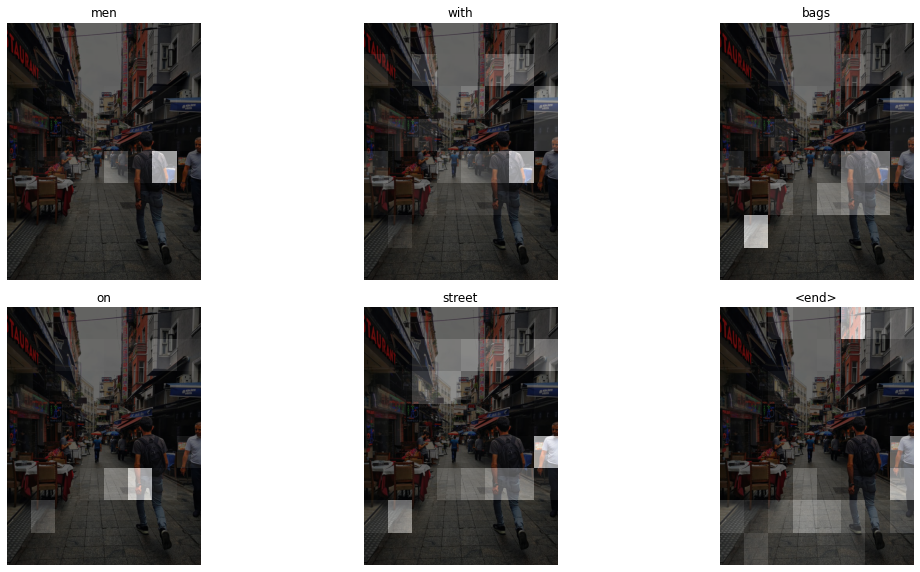

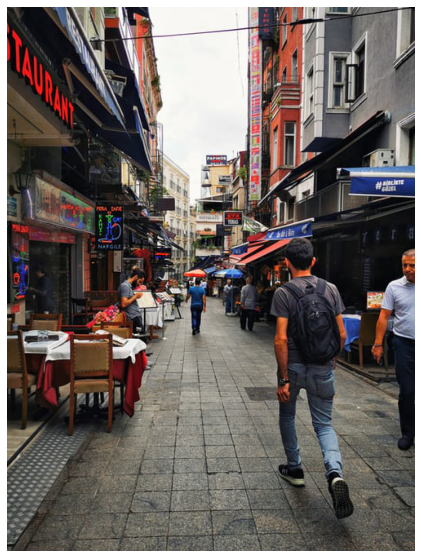

In [0]:
image_url = "https://images.unsplash.com/photo-1565560665589-37da0a389949?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=500&q=60" #@param {type:"string"}
image_extension = image_url[-4:]
image_path = tf.keras.utils.get_file('image'+image_extension,
                                     cache_subdir="/content/",
                                     origin=image_url)
predict(name=image_path, encoder=encoder2, decoder=decoder2)
os.remove(image_path)